In [4]:
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from tensorflow import keras
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
import pickle

In [8]:
pip install openpyxl


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [10]:
pip install ipython

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
pip install ipykernel

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
pip install --upgrade nbformat


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
import nbformat
import IPython
import ipykernel

In [6]:
import plotly.express as px
from plotly import io as pio

In [7]:
#Читаем файлы Excel, смотрим содержимое первых 5 строк, количество строк и столбцов
ds1 = pd.read_excel('X_bp.xlsx')
ds1.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [8]:
ds1.shape

(1023, 11)

In [9]:
ds2 = pd.read_excel('X_nup.xlsx')
ds2.head()

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.0,57.0
1,1,0,4.0,60.0
2,2,0,4.0,70.0
3,3,0,5.0,47.0
4,4,0,5.0,57.0


In [10]:
ds2.shape

(1040, 4)

In [11]:
#объединяем первичные датафреймы из двух файлов в один по индексу по типу объединения INNER, смотрим верхнюю и нижнюю часть объединённого датафрейма, количество строк и столбцов
df = pd.merge(ds1, ds2, left_index=True, right_index=True, how='inner')
df.head()

,Unnamed: 0_x,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Unnamed: 0_y,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,0,4.0,57.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,1,0,4.0,60.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,2,0,4.0,70.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,3,0,5.0,47.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,4,0,5.0,57.0


In [12]:
df.tail()

,Unnamed: 0_x,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Unnamed: 0_y,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1018,90,9.076380,47.019770
1019,1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1019,90,10.565614,53.750790
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1020,90,4.161154,67.629684
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1021,90,6.313201,58.261074
1022,1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,1022,90,6.078902,77.434468


In [13]:
df.shape

(1023, 15)

In [14]:
#Удаляем неинформативные столбцы Unnamed: 0_x, Unnamed: 0_y
df.drop(['Unnamed: 0_x', 'Unnamed: 0_y'], axis=1, inplace=True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [15]:
# Преобразуем переменную "Угол нашивки, град", т.к. два значения - 0 и 90 (т.е. угол 0 и прямой угол) - выглядят как категориальные
angle_0_count = df['Угол нашивки, град'][df['Угол нашивки, град'] == 0.0].count()
print(f"Количество элементов, где 'Угол нашивки' равен 0: {angle_0_count}")

# Приводим столбец 'Угол нашивки, град' к значениям 0 и 1 и преобразуем в тип integer
df = df.replace({'Угол нашивки, град': {0.0: 0, 90.0: 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

# Переименовываем столбец
df = df.rename(columns={'Угол нашивки, град': 'Угол нашивки'})

# Проверяем количество записей, где 'Угол нашивки' равен 0 после преобразования
angle_0_after = df['Угол нашивки'][df['Угол нашивки'] == 0].count()
print(f"Количество элементов, где 'Угол нашивки' равен 0 после преобразования: {angle_0_after}")

# Преобразование индекса в тип integer
df.index = df.index.astype('int')

Количество элементов, где 'Угол нашивки' равен 0: 520
Количество элементов, где 'Угол нашивки' равен 0 после преобразования: 520


In [16]:
df.shape

(1023, 13)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки                          1023 non-null   int64  
 11  Шаг нашивки           

In [18]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [19]:
df.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [20]:
#смотрим количество уникальных значений
df.nunique(axis=0)

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки                               2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [21]:
# Проверяем датасет на дубликаты
df.duplicated().sum()

np.int64(0)

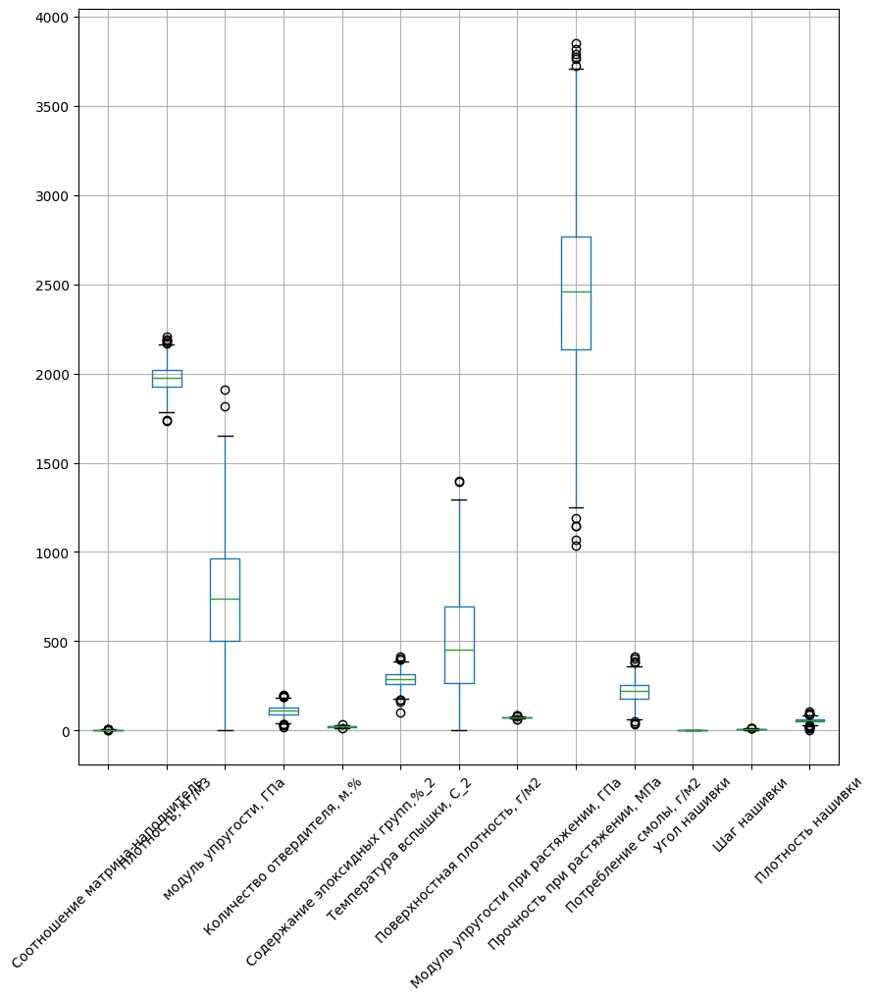

In [22]:
#Вывод "ящиков с усами" для предварительной (визуальной) оценки выбросов
boxplot = df.boxplot(rot=45, figsize=(10,10))
plt.show()

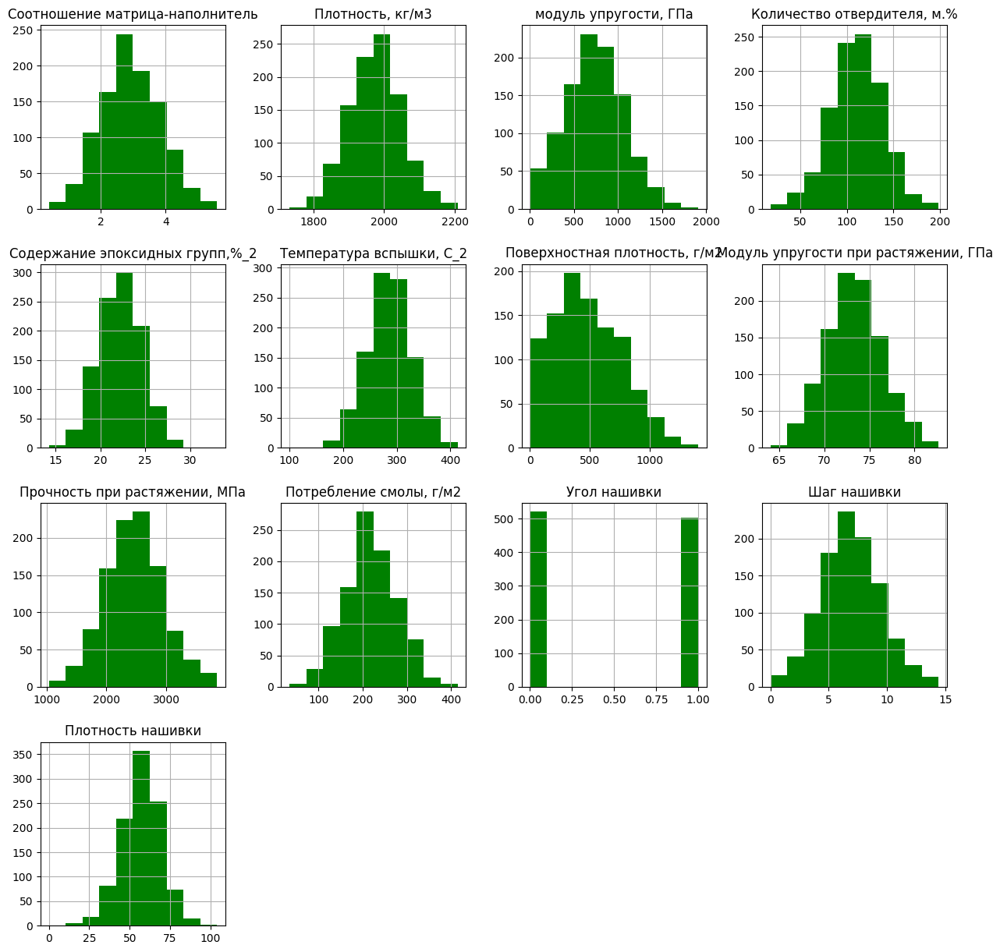

In [23]:
#Гистограммы распределения каждой из переменных
df.hist(figsize=(15,15), color="g")
plt.show()

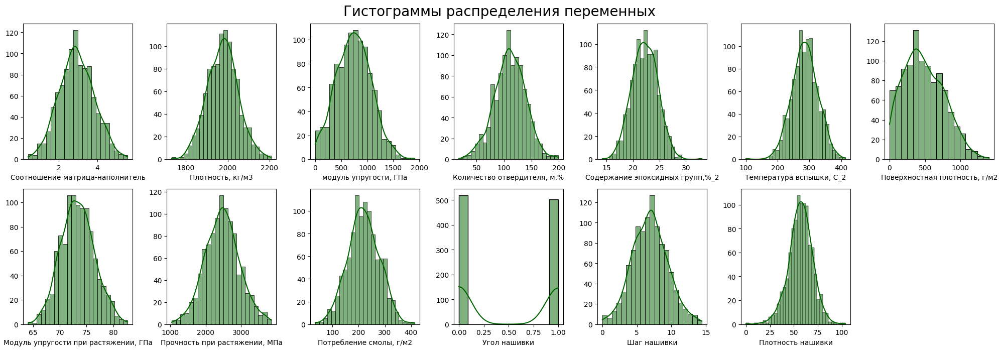

In [24]:
# Параметры для настройки размеров и сетки
rows = 3  #количество строк
cols = 7  #количество столбцов
plot_counter = 1  # счетчик для размещения графиков

# Размер фигуры
plt.figure(figsize=(20, 10))

# Заголовок для всей совокупности гистограмм
plt.suptitle('Гистограммы распределения переменных', fontsize=20)

# Перебор всех столбцов в датафрейме для построения гистограмм
for column in df.columns:
    plt.subplot(rows, cols, plot_counter)  # Создание подграфика
    sns.histplot(data=df[column], kde=True, color="darkgreen")  # Построение гистограммы с кривой плотности вероятности (Kernel Density Estimate, KDE)
    plt.ylabel(None)  # Убираем метку оси Y
    plot_counter += 1  # Увеличиваем счетчик для следующего графика

# Вывод графиков
plt.tight_layout()
plt.show()


In [25]:
# "Ящики с усами"(боксплоты)

#Нормализуем данные для приведения к согласованному формату и вывода боксплотов
scaler = MinMaxScaler()
dataset_norm = scaler.fit_transform(np.array(df[['Соотношение матрица-наполнитель',
                           'Плотность, кг/м3',
                      'модуль упругости, ГПа',
                'Количество отвердителя, м.%',
            'Содержание эпоксидных групп,%_2',
                   'Температура вспышки, С_2',
              'Поверхностная плотность, г/м2',
       'Модуль упругости при растяжении, ГПа',
              'Прочность при растяжении, МПа',
                    'Потребление смолы, г/м2',
                            'Угол нашивки',
                                'Шаг нашивки',
                          'Плотность нашивки']]))


In [26]:
#Возвращаем названия столбцов после нормализации, выводим верхние строки нормализованного датасета
dataset_norm_df = pd.DataFrame(data = dataset_norm, columns =['Соотношение матрица-наполнитель',
                           'Плотность, кг/м3',
                      'модуль упругости, ГПа',
                'Количество отвердителя, м.%',
            'Содержание эпоксидных групп,%_2',
                   'Температура вспышки, С_2',
              'Поверхностная плотность, г/м2',
       'Модуль упругости при растяжении, ГПа',
              'Прочность при растяжении, МПа',
                    'Потребление смолы, г/м2',
                         'Угол нашивки',
                                'Шаг нашивки',
                          'Плотность нашивки'])
dataset_norm_df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.548135
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.576985
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.673149
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.451971
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.548135


In [27]:
dataset_norm_df.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
1018,0.361750,0.462855,0.476884,0.382158,0.313057,0.717503,0.149109,0.485125,0.480312,0.239516,1.0,0.628535,0.452161
1019,0.587163,0.668737,0.231678,0.707685,0.285131,0.492271,0.250230,0.475992,0.470745,0.220404,1.0,0.731664,0.516890
1020,0.555750,0.505470,0.217065,0.512067,0.517605,0.473781,0.528643,0.573346,0.578340,0.532590,1.0,0.288158,0.650355
1021,0.637396,0.703842,0.387114,0.682389,0.266309,0.561107,0.458108,0.536217,0.368070,0.428909,1.0,0.437186,0.560262
1022,0.657131,0.333290,0.217317,0.614984,0.705242,0.641461,0.541942,0.550550,0.647135,0.422680,1.0,0.420961,0.744642


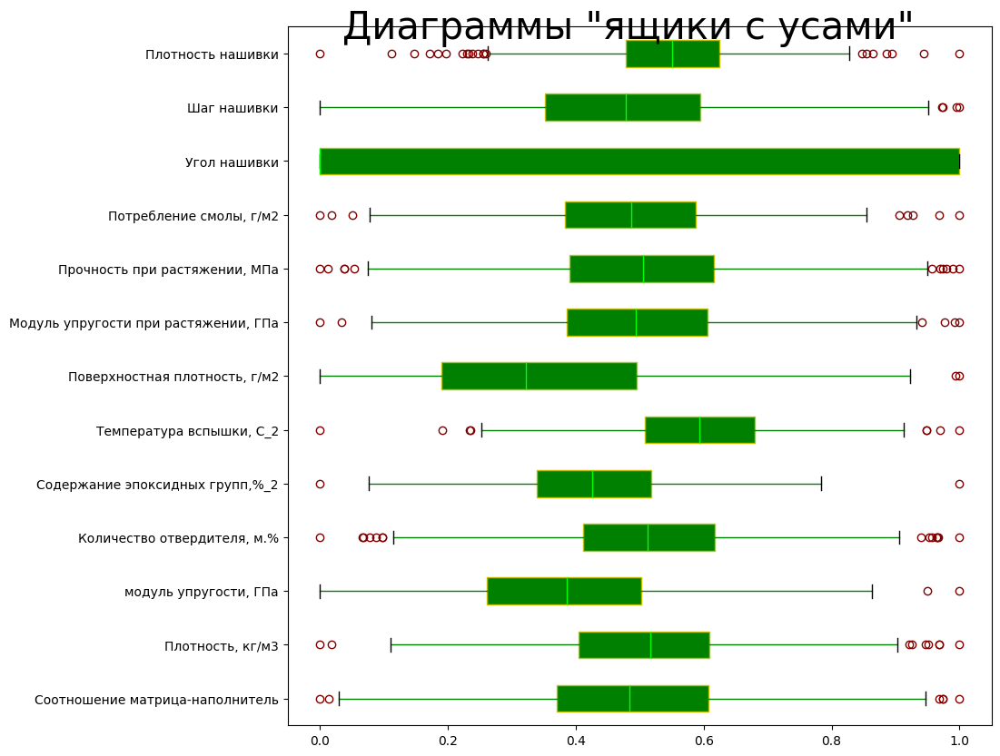

In [28]:
plt.figure(figsize = (10, 10))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
plt.boxplot(dataset_norm_df, tick_labels = dataset_norm_df.columns, patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),
            medianprops = dict(color = 'lime'), whiskerprops = dict(color="g"), capprops = dict(color = "black"), 
            flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

<Figure size 640x480 with 0 Axes>

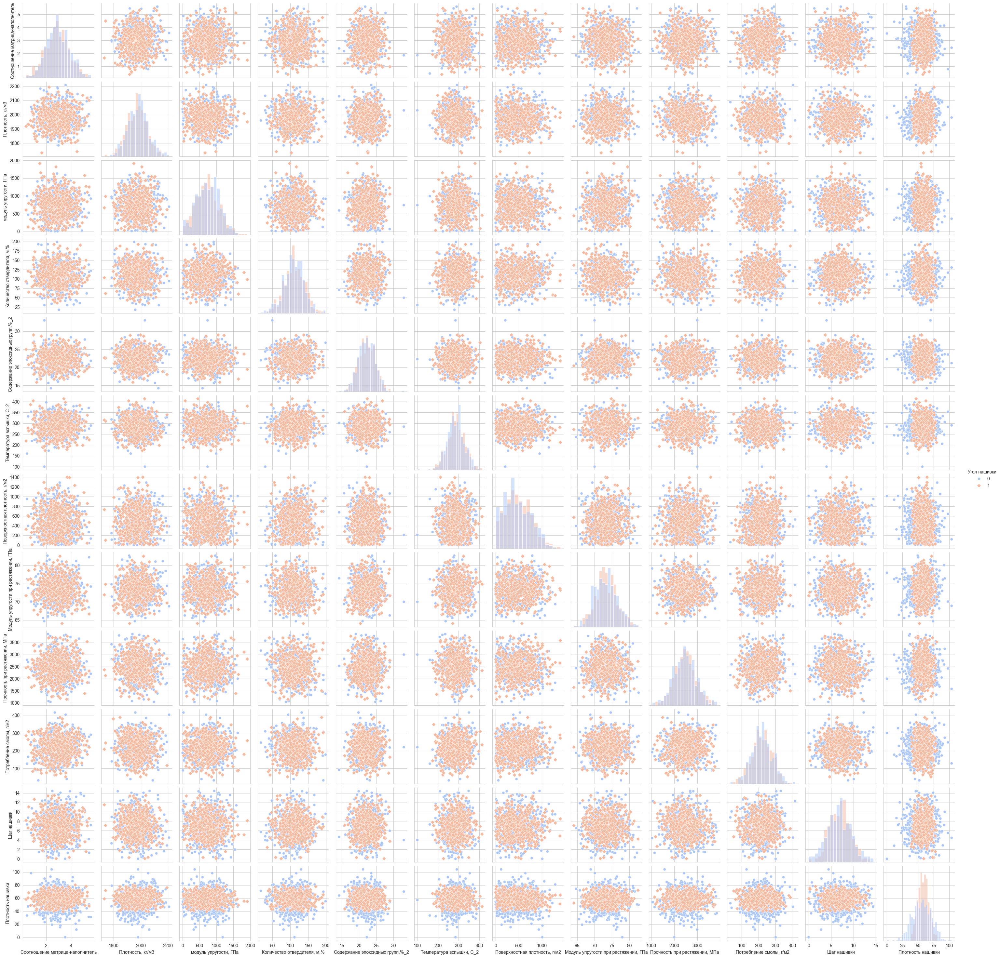

In [34]:
# Настраиваем стиль графиков
sns.set_style('whitegrid')

# Выводим попарные графики рассеяния с выделением по значению переменной "Угол нашивки" цветом и маркером
plt.suptitle('Попарные графики рассеяния точек', fontsize=20, y = 0.9)
sns.pairplot(df, hue='Угол нашивки', markers=["o", "D"], diag_kind='hist', palette='coolwarm')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

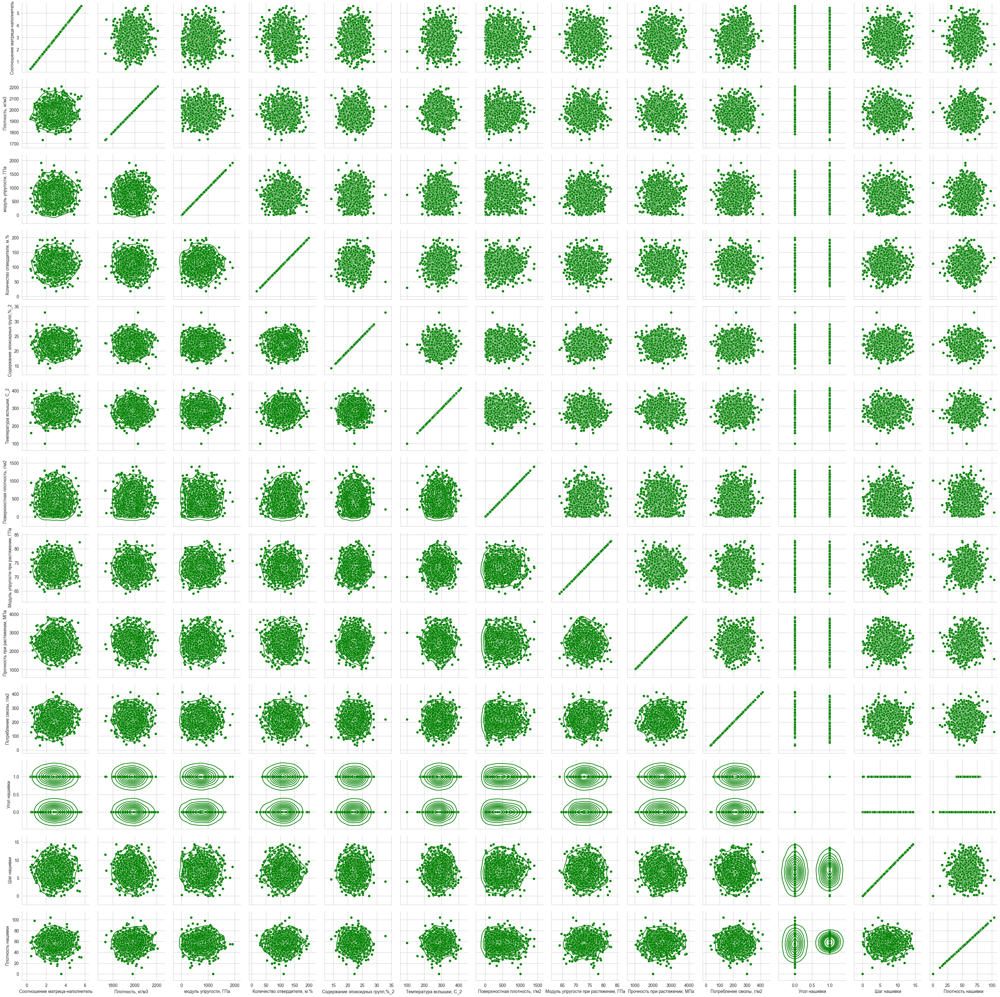

In [35]:
# Попарные графики рассеяния точек - скаттерплоты
g = sns.PairGrid(df[df.columns])
g.map(sns.scatterplot, color = 'green')
g.map_upper(sns.scatterplot, color = 'green')
g.map_lower(sns.kdeplot, color = 'green')
plt.show

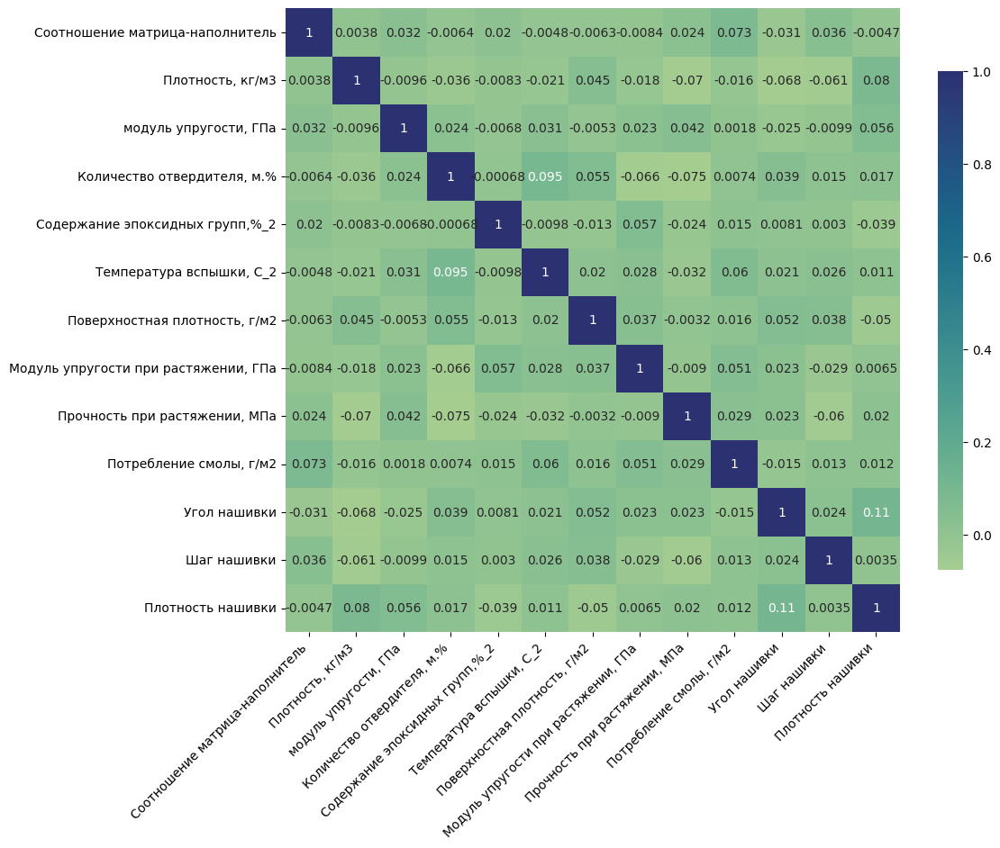

In [29]:
plt.figure(figsize=(11, 9))
ax = sns.heatmap(dataset_norm_df.corr(), annot=True, cmap='crest', cbar_kws={'shrink': 0.8})
ax.set(xlabel="", ylabel="")
plt.xticks(rotation=45, ha='right')
plt.show()

In [30]:
#Вывод среднего значения (mean) и медианного значения (50%) для всех колонок
print(df.describe().loc['mean'])

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки                               0.491691
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
Name: mean, dtype: float64


In [31]:
print(df.describe().loc['50%'])

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Угол нашивки                               0.000000
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
Name: 50%, dtype: float64


In [32]:
#Анализ и исключение выбросов
#Чтобы выявить выбросы, используем метод межквартильного интервала (IQR, Interquartile Range)

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Определяем границы для выбросов: нижнюю - "влево" от первого квартиля, верхнюю - "вправо" от третьего квартиля
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Определяем количество значений, которые выходят за пределы этих границ
outliers = ((df < lower_bound) | (df > upper_bound)).sum()
outliers_rate = ((((df < lower_bound) | (df > upper_bound)).sum()/df.count())*100)

# Отображаем количество выбросов для каждого столбца
print("Количество выбросов в каждом столбце:")
print(outliers)

Количество выбросов в каждом столбце:
Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки                             0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64


In [33]:
# Отображаем удельный вес количества выбросов в общем количестве значений для каждого столбца
print("Удельный вес количества выбросов в общем количестве значений в столбце")
print(outliers_rate)

Удельный вес количества выбросов в общем количестве значений в столбце
Соотношение матрица-наполнитель         0.586510
Плотность, кг/м3                        0.879765
модуль упругости, ГПа                   0.195503
Количество отвердителя, м.%             1.368524
Содержание эпоксидных групп,%_2         0.195503
Температура вспышки, С_2                0.782014
Поверхностная плотность, г/м2           0.195503
Модуль упругости при растяжении, ГПа    0.586510
Прочность при растяжении, МПа           1.075269
Потребление смолы, г/м2                 0.782014
Угол нашивки                            0.000000
Шаг нашивки                             0.391007
Плотность нашивки                       2.052786
dtype: float64


In [34]:
# Удаляем строки с выбросами
df_cleaned = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]

# Выводим количество строк после удаления выбросов
print(f"Количество строк после удаления выбросов: {df_cleaned.shape[0]}")

Количество строк после удаления выбросов: 936


In [35]:
(df_cleaned.shape[0]/df.shape[0])*100

91.49560117302052

In [36]:
columns = ['Соотношение матрица-наполнитель',
                           'Плотность, кг/м3',
                      'модуль упругости, ГПа',
                'Количество отвердителя, м.%',
            'Содержание эпоксидных групп,%_2',
                   'Температура вспышки, С_2',
              'Поверхностная плотность, г/м2',
       'Модуль упругости при растяжении, ГПа',
              'Прочность при растяжении, МПа',
                    'Потребление смолы, г/м2',
                         'Угол нашивки',
                                'Шаг нашивки',
                          'Плотность нашивки'] #Задаём переменную для удобства

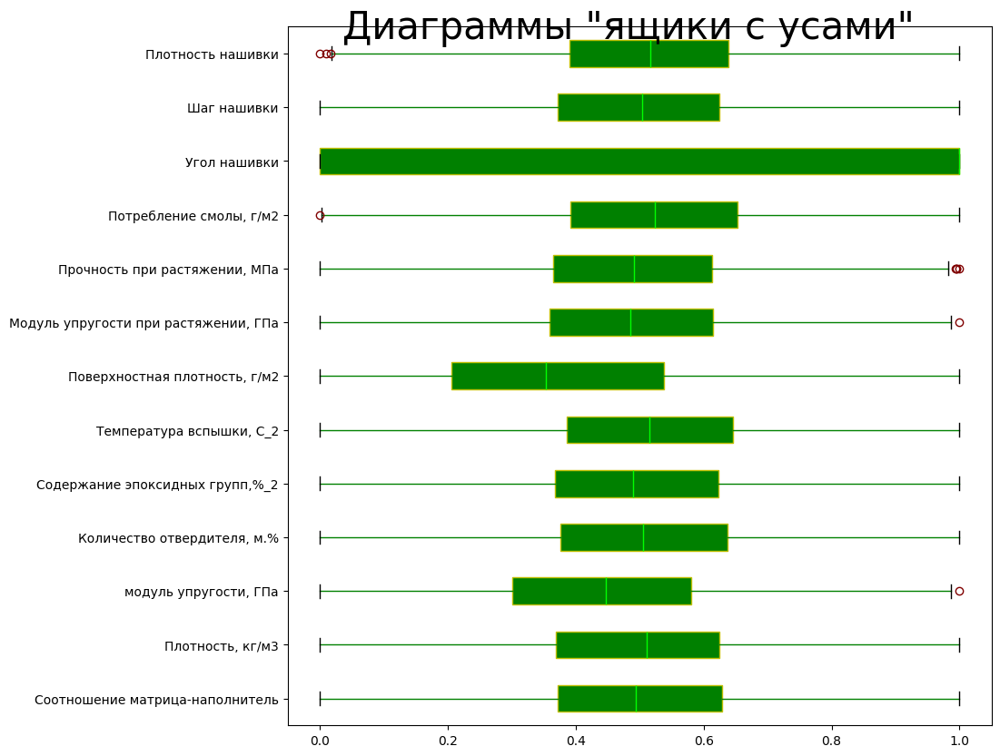

In [37]:
# "Ящики с усами"(боксплоты)

#Нормализуем данные для приведения к согласованному формату и вывода боксплотов
scaler = MinMaxScaler()
df_cleaned_norm = scaler.fit_transform(np.array(df_cleaned[columns]))
#Возвращаем названия столбцов после нормализации, выводим верхние строки нормализованного датасета
df_cleaned_norm_df = pd.DataFrame(data = df_cleaned_norm, columns = columns)
df_cleaned_norm_df.head()


plt.figure(figsize = (10, 10))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
plt.boxplot(df_cleaned_norm_df, tick_labels = df_cleaned.columns, patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),
            medianprops = dict(color = 'lime'), whiskerprops = dict(color="g"), capprops = dict(color = "black"), 
            flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

In [38]:
#Анализ и исключение выбросов - 2 итерация
#Чтобы выявить выбросы, используем метод межквартильного интервала (IQR, Interquartile Range)

Q1 = df_cleaned.quantile(0.25)
Q3 = df_cleaned.quantile(0.75)
IQR = Q3 - Q1

# Определяем границы для выбросов: нижнюю - "влево" от первого квартиля, верхнюю - "вправо" от третьего квартиля
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Определяем количество значений, которые выходят за пределы этих границ
outliers = ((df_cleaned < lower_bound) | (df_cleaned > upper_bound)).sum()
outliers_rate = ((((df_cleaned < lower_bound) | (df_cleaned > upper_bound)).sum()/df.count())*100)

# Отображаем количество выбросов для каждого столбца
print("Количество выбросов в каждом столбце:")
print(outliers)

Количество выбросов в каждом столбце:
Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       3
dtype: int64


In [39]:
# Удаляем строки с выбросами
df_cleaned2 = df_cleaned[~((df_cleaned < lower_bound) | (df_cleaned > upper_bound)).any(axis=1)]

# Выводим количество строк после удаления выбросов
print(f"Количество строк после удаления выбросов: {df_cleaned2.shape[0]}")

Количество строк после удаления выбросов: 926


In [40]:
(df_cleaned2.shape[0]/df.shape[0])*100

90.51808406647116

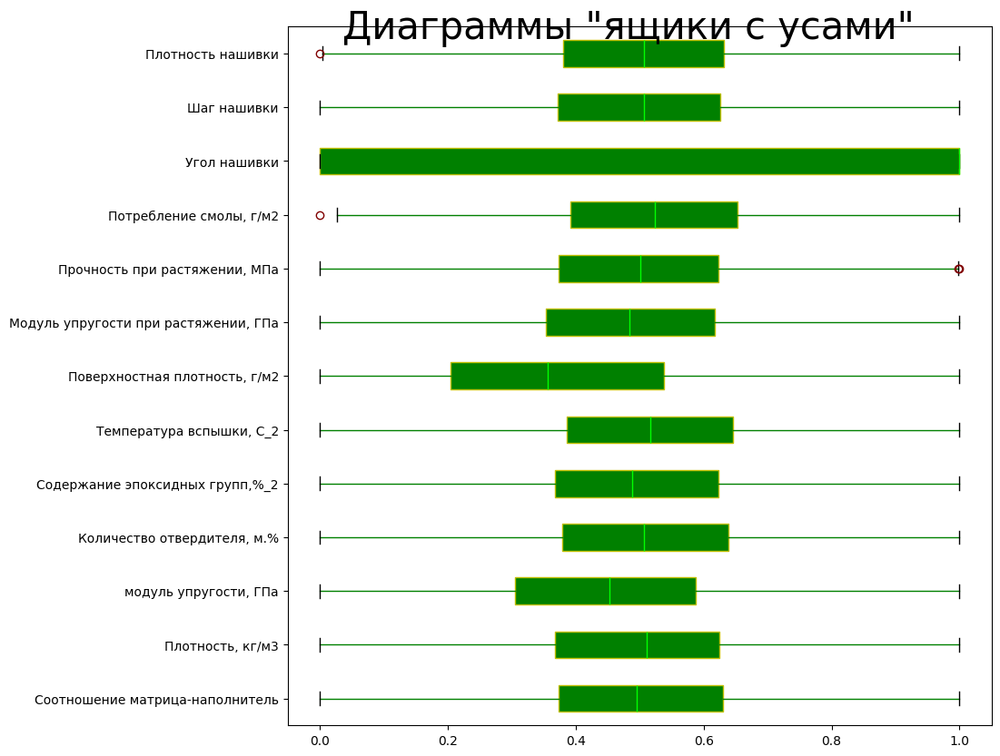

In [41]:
# "Ящики с усами"(боксплоты)

#Нормализуем данные для приведения к согласованному формату и вывода боксплотов
scaler = MinMaxScaler()
df_cleaned2_norm = scaler.fit_transform(np.array(df_cleaned2[columns]))
#Возвращаем названия столбцов после нормализации, выводим верхние строки нормализованного датасета
df_cleaned2_norm_df = pd.DataFrame(data = df_cleaned2_norm, columns = columns)
df_cleaned2_norm_df.head()


plt.figure(figsize = (10, 10))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
plt.boxplot(df_cleaned2_norm_df, tick_labels = df_cleaned2.columns, patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),
            medianprops = dict(color = 'lime'), whiskerprops = dict(color="g"), capprops = dict(color = "black"), 
            flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

In [42]:
#Анализ и исключение выбросов - 3 итерация
#Чтобы выявить выбросы, используем метод межквартильного интервала (IQR, Interquartile Range)

Q1 = df_cleaned2.quantile(0.25)
Q3 = df_cleaned2.quantile(0.75)
IQR = Q3 - Q1

# Определяем границы для выбросов: нижнюю - "влево" от первого квартиля, верхнюю - "вправо" от третьего квартиля
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Определяем количество значений, которые выходят за пределы этих границ
outliers = ((df_cleaned2 < lower_bound) | (df_cleaned2 > upper_bound)).sum()
outliers_rate = ((((df_cleaned2 < lower_bound) | (df_cleaned2 > upper_bound)).sum()/df.count())*100)

# Отображаем количество выбросов для каждого столбца
print("Количество выбросов в каждом столбце:")
print(outliers)

Количество выбросов в каждом столбце:
Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           2
Потребление смолы, г/м2                 1
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       1
dtype: int64


In [43]:
# Удаляем строки с выбросами
df_cleaned3 = df_cleaned2[~((df_cleaned2 < lower_bound) | (df_cleaned2 > upper_bound)).any(axis=1)]

# Выводим количество строк после удаления выбросов
print(f"Количество строк после удаления выбросов: {df_cleaned3.shape[0]}")

Количество строк после удаления выбросов: 922


In [44]:
(df_cleaned3.shape[0]/df.shape[0])*100

90.12707722385142

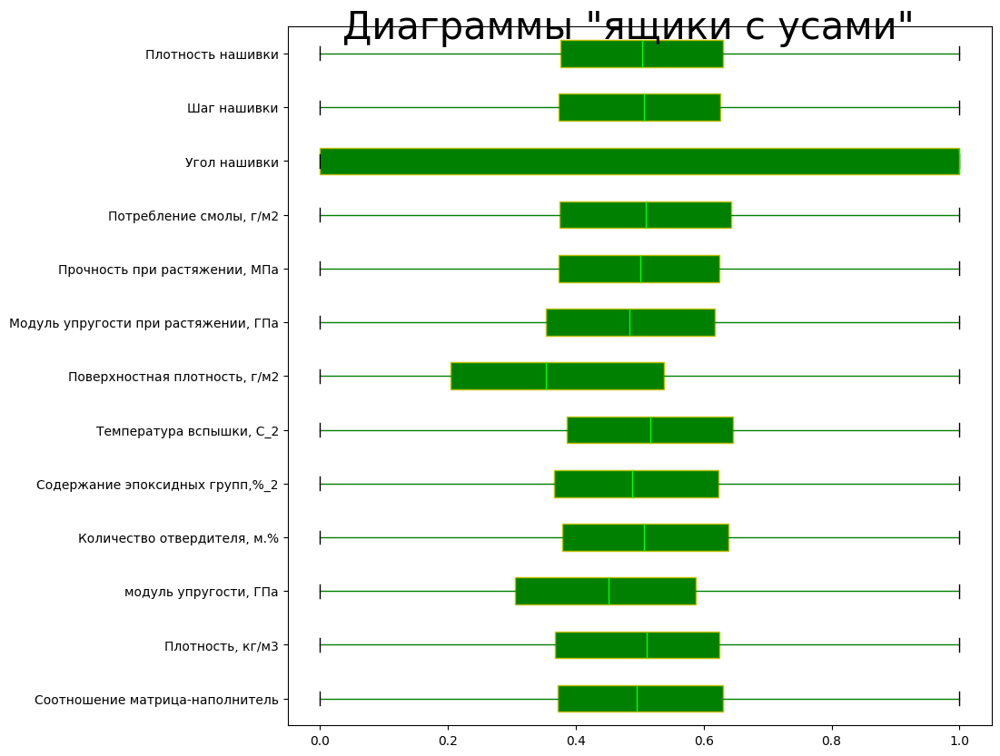

In [45]:
# "Ящики с усами"(боксплоты)

#Нормализуем данные для приведения к согласованному формату и вывода боксплотов
scaler = MinMaxScaler()
df_cleaned3_norm = scaler.fit_transform(np.array(df_cleaned3[columns]))
#Возвращаем названия столбцов после нормализации, выводим верхние строки нормализованного датасета
df_cleaned3_norm_df = pd.DataFrame(data = df_cleaned3_norm, columns = columns)
df_cleaned3_norm_df.head()


plt.figure(figsize = (10, 10))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
plt.boxplot(df_cleaned3_norm_df, tick_labels = df_cleaned3.columns, patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),
            medianprops = dict(color = 'lime'), whiskerprops = dict(color="g"), capprops = dict(color = "black"), 
            flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

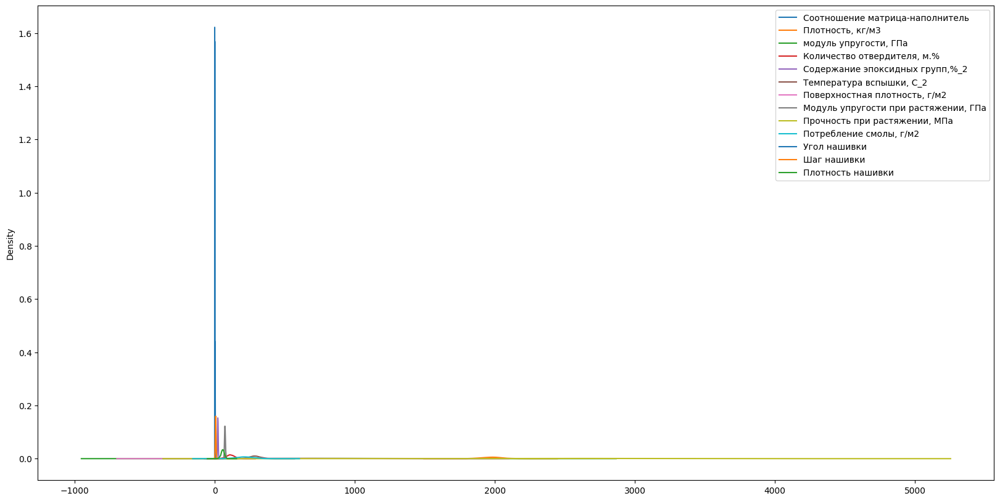

In [46]:
# Оценка плотности ядра до нормализации
def plt_kde(df):
  fig, ax = plt.subplots(figsize=(20, 10))
  df.plot(kind='kde', ax=ax)
plt_kde(df)

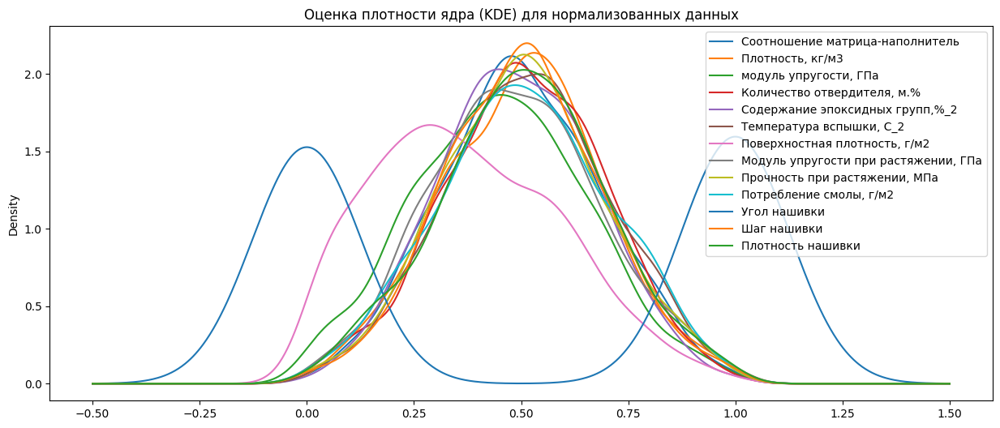

In [47]:
#Выводим график оценки плотности ядра (KDE) для нормализованных MinMaxScaler данных
fig, ax = plt.subplots(figsize = (15, 6))
df_cleaned3_norm_df.plot(kind = 'kde', ax = ax)  #график плотности ядра для нормализованных данных
plt.title('Оценка плотности ядра (KDE) для нормализованных данных')
plt.show()

In [48]:
# Стандартизируем данные с помощью StandardScaler
df_norm_std = StandardScaler().fit(df_cleaned3_norm_df)

# Применяем трансформацию (стандартизацию) к данным
df_std = df_norm_std.transform(df_cleaned3_norm_df)

# Создаем DataFrame из стандартизированных данных
df_std_2 = pd.DataFrame(df_std, columns=df_cleaned3_norm_df.columns)

# Выводим первые несколько строк для проверки
df_std_2.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,-1.196467,0.787037,0.007992,-2.286425,0.647585,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-1.166792,0.219240
1,-1.196467,0.787037,0.007992,0.668092,-0.397291,0.350738,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.950227
2,-0.175012,0.787037,0.051553,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.050637
3,-0.178825,0.364514,0.036283,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,0.219240
4,-0.400390,-0.903054,0.216474,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,1.118831


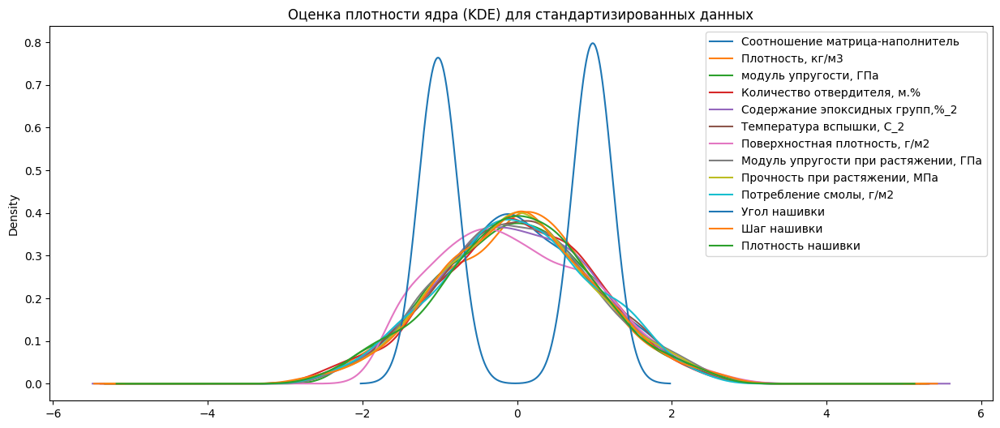

In [49]:
#Выводим график оценки плотности ядра (KDE) для стандартизированных данных
fig, ax = plt.subplots(figsize = (15, 6))
df_std_2.plot(kind = 'kde', ax = ax)  #график плотности ядра для нормализованных данных
plt.title('Оценка плотности ядра (KDE) для стандартизированных данных')
plt.show()

In [51]:
# Разделяем данные на обучающую и тестовую выборки, выделяя предикторы и целевую переменную
# В качестве предикторов (X) выбираем все столбцы, кроме 'Прочность при растяжении, МПа'
# Целевая переменная (y) - это столбец 'Прочность при растяжении, МПа'
x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(
    df_std_2.loc[:, df_std_2.columns != 'Прочность при растяжении, МПа'],  # Все столбцы, кроме целевой переменной
    df_std_2[['Прочность при растяжении, МПа']],  # Целевая переменная
    test_size=0.3,  # 30% данных выделяется на тестирование
    random_state=42  # Фиксируем случайное состояние для воспроизводимости
)

# Проверим размеры выборок
print(f"Размер обучающей выборки X: {x_train_1.shape}")
print(f"Размер тестовой выборки X: {x_test_1.shape}")
print(f"Размер обучающей выборки y: {y_train_1.shape}")
print(f"Размер тестовой выборки y: {y_test_1.shape}")

Размер обучающей выборки X: (645, 12)
Размер тестовой выборки X: (277, 12)
Размер обучающей выборки y: (645, 1)
Размер тестовой выборки y: (277, 1)


In [52]:
# Проверка корректности разбивки данных
# Мы проверяем, что сумма размера обучающей и тестовой выборки равна общему числу строк в исходных данных
data_remaining = df_std_2.shape[0] - x_train_1.shape[0] - x_test_1.shape[0]

# Выводим результат
print(f"Оставшиеся строки (проверка): {data_remaining}")

Оставшиеся строки (проверка): 0


1 - Линейная регрессия

In [53]:
#Создаем модель линейной регрессии
lr = LinearRegression()

#Обучаем модель на тренировочной выборке
lr.fit(x_train_1, np.ravel(y_train_1))

#Делаем прогноз на тестовой выборке
y_pred_lr = lr.predict(x_test_1)

In [54]:
# Задаём метрики качества модели
mae_lr = mean_absolute_error(y_pred_lr, y_test_1)
mse_lr = mean_squared_error(y_test_1, y_pred_lr)
rmse_lr = np.sqrt(mse_lr)

# Выводим результаты для тренировки
print("Результаты применения Linear Regression на обучающей выборке:")
print(f"Training score (R^2): {lr.score(x_train_1, y_train_1):.2f}")

# Выводим результаты для тестирования
print("\nРезультаты применения Linear Regression на тестовой выборке:")
print(f"Test score (R^2): {lr.score(x_test_1, y_test_1):.2f}")
print(f"MAE (Mean Absolute Error): {mae_lr:.2f}")
print(f"MAPE (Mean Absolute Percentage Error): {mean_absolute_percentage_error(y_test_1, y_pred_lr):.2f}")
print(f"MSE (Mean Squared Error): {mse_lr:.2f}")
print(f"RMSE (Root Mean Squared Error): {rmse_lr:.2f}")

Результаты применения Linear Regression на обучающей выборке:
Training score (R^2): 0.02

Результаты применения Linear Regression на тестовой выборке:
Test score (R^2): -0.01
MAE (Mean Absolute Error): 0.82
MAPE (Mean Absolute Percentage Error): 2.66
MSE (Mean Squared Error): 1.05
RMSE (Root Mean Squared Error): 1.02


2 - Случайный лес

In [55]:
# Инициализация модели случайного леса с заданными гиперпараметрами
rfr = RandomForestRegressor(n_estimators=15, max_depth=7, random_state=33)

# Обучаем модель на тренировочных данных
rfr.fit(x_train_1, np.ravel(y_train_1))

# Прогнозируем значения на тестовой выборке
y_pred_forest = rfr.predict(x_test_1)

# Оценка модели с помощью различных метрик
mae_rfr = mean_absolute_error(y_test_1, y_pred_forest)  # Средняя абсолютная ошибка
mse_rfr = mean_squared_error(y_test_1, y_pred_forest)  # Среднеквадратическая ошибка

# Вывод результатов на тренировочной выборке
print('Random Forest Regressor Results Train:')
print(f"Test score (Train set): {rfr.score(x_train_1, y_train_1):.2f}")  # Скор для тренировочной выборки

# Вывод метрик для тестовой выборки
print('Random Forest Regressor Results:')
print(f'RF_MAE: {round(mae_rfr, 2)}')  # Средняя абсолютная ошибка
print(f'RF_MAPE: {round(mean_absolute_percentage_error(y_test_1, y_pred_forest), 2):.2f}')  # Средняя абсолютная процентная ошибка
print(f'RF_MSE: {round(mse_rfr, 2):.2f}')  # Среднеквадратическая ошибка
print(f"RF_RMSE: {round(np.sqrt(mse_rfr), 2):.2f}")  # Корень из среднеквадратической ошибки

# Оценка точности модели на тестовой выборке
print(f"Test score (Test set): {rfr.score(x_test_1, y_test_1):.2f}")  # Скор для тестовой выборки

Random Forest Regressor Results Train:
Test score (Train set): 0.48
Random Forest Regressor Results:
RF_MAE: 0.85
RF_MAPE: 3.24
RF_MSE: 1.13
RF_RMSE: 1.06
Test score (Test set): -0.09


3 - Градиентный бустинг

In [56]:
# Создание и обучение модели Gradient Boosting Regressor
gbr = GradientBoostingRegressor()

# Обучение модели
gbr.fit(x_train_1, np.ravel(y_train_1))

# Прогнозирование
y_pred_gbr = gbr.predict(x_test_1)

# Расчет различных метрик
mae_gbr = mean_absolute_error(y_test_1, y_pred_gbr)
mse_gbr = mean_squared_error(y_test_1, y_pred_gbr)

# Вывод результатов на тренировочной выборке
print('Gradient Boosting Regressor Results Train:')
print("Test score for training data: {:.2f}".format(gbr.score(x_train_1, y_train_1)))  # Скор для тренировочной выборки

# Вывод результатов на тестовой выборке
print('Gradient Boosting Regressor Results:')
print(f'GBR_MAE: {mae_gbr:.2f}')  # Средняя абсолютная ошибка
print(f'GBR_MAPE: {mean_absolute_percentage_error(y_test_1, y_pred_gbr):.2f}')  # Средняя абсолютная процентная ошибка
print(f'GBR_MSE: {mse_gbr:.2f}')  # Среднеквадратическая ошибка
print(f"GBR_RMSE: {np.sqrt(mse_gbr):.2f}")  # Корень из среднеквадратичной ошибки
print(f"Test score for test data: {gbr.score(x_test_1, y_test_1):.2f}")  # Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score for training data: 0.51
Gradient Boosting Regressor Results:
GBR_MAE: 0.85
GBR_MAPE: 4.02
GBR_MSE: 1.10
GBR_RMSE: 1.05
Test score for test data: -0.05


In [ ]:
4 - SVM (метод опорных векторов)

In [58]:
svr = make_pipeline(SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr.fit(x_train_1, np.ravel(y_train_1))
#вычисляем коэффициент детерминации
y_pred_svr=svr.predict(x_test_1)
mae_svr = mean_absolute_error(y_pred_svr, y_test_1)
mse_svr = mean_squared_error(y_test_1,y_pred_svr)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_1, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_svr)))
print('SVR_MSE: {:.2f}'.format(mse_svr))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr)))
print("Test score: {:.2f}".format(svr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.44
Support Vector Regression Results:
SVR_MAE: 1
SVR_MAPE: 5.96
SVR_MSE: 1.29
SVR_RMSE: 1.13
Test score: -0.24


5 - Метод K ближайших соседей (KNN)

In [59]:
# Инициализируем и обучаем модель K Neighbors Regressor
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train_1, np.ravel(y_train_1))

# Прогнозирование на тестовых данных
y_pred_knn = knn.predict(x_test_1)

# Оценка модели
mae_knn = mean_absolute_error(y_pred_knn, y_test_1)  # Средняя абсолютная ошибка
mse_knn = mean_squared_error(y_test_1, y_pred_knn)  # Среднеквадратическая ошибка

# Вывод результатов для тренировочной выборки
print('K Neighbors Regressor  Results Train:')
print("Train score: {:.2f}".format(knn.score(x_train_1, y_train_1)))  # Скор для тренировочной выборки

# Вывод результатов для тестовой выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mae_knn))  # Средняя абсолютная ошибка
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_knn)))  # Средняя абсолютная процентная ошибка
print('KNN_MSE: {:.2f}'.format(mse_knn))  # Среднеквадратическая ошибка
print("KNN_RMSE: {:.2f}".format(np.sqrt(mse_knn)))  # Корень из среднеквадратичной ошибки
print("Test score: {:.2f}".format(knn.score(x_test_1, y_test_1)))  # Скор для тестовой выборки

K Neighbors Regressor  Results Train:
Train score: 0.22
K Neighbors Regressor  Results:
KNN_MAE:  1
KNN_MAPE: 3.08
KNN_MSE: 1.26
KNN_RMSE: 1.12
Test score: -0.21


In [60]:
# Применяем нормализацию данных с использованием Normalizer (вместо StandardScaler)
normalizer = Normalizer()  # Создаем объект для нормализации данных
res = normalizer.fit_transform(df_cleaned3_norm_df)  # Применяем нормализацию к данным

# Преобразуем результат обратно в DataFrame с теми же именами столбцов
df_norm_n = pd.DataFrame(res, columns = df_cleaned2_norm_df.columns)

# Выводим преобразованный датасет для проверки
df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,0.169857,0.402497,0.280006,0.048931,0.375506,0.314757,0.100288,0.168740,0.449899,0.318171,0.000000,0.178861,0.337795
1,0.165760,0.392790,0.273253,0.380655,0.252703,0.352068,0.097869,0.164671,0.439049,0.310498,0.000000,0.218599,0.192901
2,0.274350,0.382870,0.271512,0.300638,0.291463,0.299408,0.095397,0.160512,0.427961,0.302656,0.000000,0.213078,0.290563
3,0.276151,0.338812,0.271890,0.303076,0.293826,0.301836,0.096171,0.161814,0.431431,0.305110,0.000000,0.214806,0.323929
4,0.251371,0.197231,0.293268,0.302933,0.293688,0.301693,0.096126,0.161737,0.431227,0.304966,0.000000,0.214705,0.427092
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.195910,0.240771,0.303382,0.182848,0.180875,0.381057,0.087542,0.256520,0.256173,0.099212,0.541692,0.357525,0.173397
918,0.302815,0.351001,0.135586,0.373542,0.146718,0.180434,0.135147,0.230478,0.230084,0.078610,0.498318,0.383086,0.217998
919,0.277021,0.240730,0.123162,0.242525,0.301029,0.161395,0.276812,0.280311,0.283865,0.276662,0.483127,0.145470,0.328270
920,0.318538,0.359980,0.218595,0.345025,0.128771,0.224260,0.238729,0.257388,0.164267,0.209084,0.480814,0.220331,0.248154


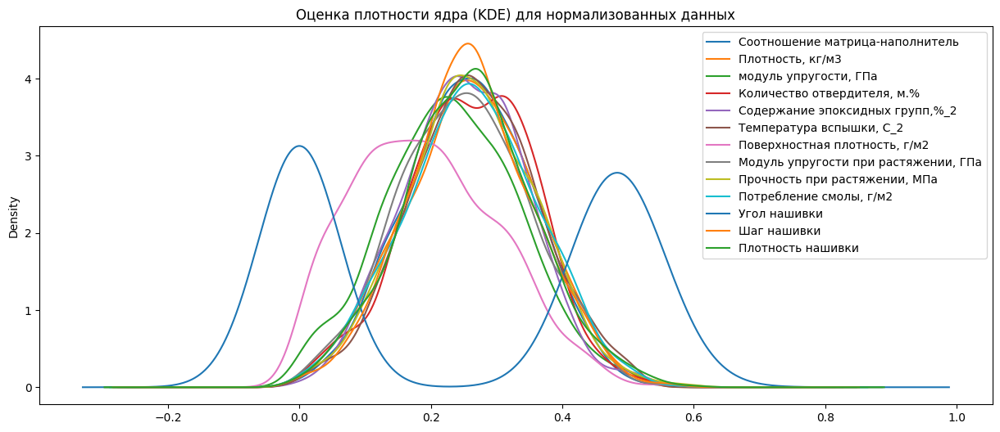

In [61]:
#Выводим график оценки плотности ядра (KDE) для нормализованных данных
fig, ax = plt.subplots(figsize = (15, 6))
df_norm_n.plot(kind = 'kde', ax = ax)  #график плотности ядра для нормализованных данных
plt.title('Оценка плотности ядра (KDE) для нормализованных данных')
plt.show()

In [62]:
# Разделяем данные на обучающую и тестовую выборки, выделяя предикторы и целевую переменную
# В качестве предикторов (X) выбираем все столбцы, кроме 'Прочность при растяжении, МПа'
# Целевая переменная (y) - это столбец 'Прочность при растяжении, МПа'
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Прочность при растяжении, МПа'],  # Все столбцы, кроме целевой переменной
    df_norm_n[['Прочность при растяжении, МПа']],  # Целевая переменная
    test_size=0.3,  # 30% данных выделяется на тестирование
    random_state=42  # Фиксируем случайное состояние для воспроизводимости
)

# Проверим размеры выборок
print(f"Размер обучающей выборки X: {x_train_2.shape}")
print(f"Размер тестовой выборки X: {x_test_2.shape}")
print(f"Размер обучающей выборки y: {y_train_2.shape}")
print(f"Размер тестовой выборки y: {y_test_2.shape}")

Размер обучающей выборки X: (645, 12)
Размер тестовой выборки X: (277, 12)
Размер обучающей выборки y: (645, 1)
Размер тестовой выборки y: (277, 1)


In [63]:
#Создаем модель линейной регрессии
lr2 = LinearRegression()

#Обучаем модель на тренировочной выборке
lr2.fit(x_train_2, np.ravel(y_train_2))

#Делаем прогноз на тестовой выборке
y_pred_lr2 = lr2.predict(x_test_2)

In [64]:
# Задаём метрики качества модели
mae_lr2 = mean_absolute_error(y_pred_lr2, y_test_2)
mse_lr2 = mean_squared_error(y_test_2, y_pred_lr2)
rmse_lr2 = np.sqrt(mse_lr2)

# Выводим результаты для тренировки
print("Результаты применения Linear Regression на обучающей выборке:")
print(f"Training score (R^2): {lr2.score(x_train_2, y_train_2):.2f}")

# Выводим результаты для тестирования
print("\nРезультаты применения Linear Regression на тестовой выборке:")
print(f"Test score (R^2): {lr2.score(x_test_2, y_test_2):.2f}")
print(f"MAE (Mean Absolute Error): {mae_lr2:.2f}")
print(f"MAPE (Mean Absolute Percentage Error): {mean_absolute_percentage_error(y_test_2, y_pred_lr2):.2f}")
print(f"MSE (Mean Squared Error): {mse_lr2:.2f}")
print(f"RMSE (Root Mean Squared Error): {rmse_lr2:.2f}")

Результаты применения Linear Regression на обучающей выборке:
Training score (R^2): 0.53

Результаты применения Linear Regression на тестовой выборке:
Test score (R^2): 0.41
MAE (Mean Absolute Error): 0.06
MAPE (Mean Absolute Percentage Error): 4913937013515.07
MSE (Mean Squared Error): 0.01
RMSE (Root Mean Squared Error): 0.08


In [65]:
# Инициализация модели случайного леса с заданными гиперпараметрами
rfr2 = RandomForestRegressor(n_estimators=15, max_depth=7, random_state=33)

# Обучаем модель на тренировочных данных
rfr2.fit(x_train_2, np.ravel(y_train_2))

# Прогнозируем значения на тестовой выборке
y_pred_forest2 = rfr2.predict(x_test_2)

# Оценка модели с помощью различных метрик
mae_rfr2 = mean_absolute_error(y_test_2, y_pred_forest2)  # Средняя абсолютная ошибка
mse_rfr2 = mean_squared_error(y_test_2, y_pred_forest2)  # Среднеквадратическая ошибка

# Вывод результатов на тренировочной выборке
print('Random Forest Regressor Results Train:')
print(f"Test score (Train set): {rfr2.score(x_train_2, y_train_2):.2f}")  # Скор для тренировочной выборки

# Вывод метрик для тестовой выборки
print('Random Forest Regressor Results:')
print(f'RF_MAE: {round(mae_rfr2, 2)}')  # Средняя абсолютная ошибка
print(f'RF_MAPE: {round(mean_absolute_percentage_error(y_test_2, y_pred_forest2), 2):.2f}')  # Средняя абсолютная процентная ошибка
print(f'RF_MSE: {round(mse_rfr2, 2):.2f}')  # Среднеквадратическая ошибка
print(f"RF_RMSE: {round(np.sqrt(mse_rfr2), 2):.2f}")  # Корень из среднеквадратической ошибки

# Оценка точности модели на тестовой выборке
print(f"Test score (Test set): {rfr2.score(x_test_2, y_test_2):.2f}")  # Скор для тестовой выборки

Random Forest Regressor Results Train:
Test score (Train set): 0.65
Random Forest Regressor Results:
RF_MAE: 0.07
RF_MAPE: 3913843742142.29
RF_MSE: 0.01
RF_RMSE: 0.09
Test score (Test set): 0.07


In [66]:
# Создание и обучение модели Gradient Boosting Regressor
gbr2 = GradientBoostingRegressor()

# Обучение модели
gbr2.fit(x_train_2, np.ravel(y_train_2))

# Прогнозирование
y_pred_gbr2 = gbr2.predict(x_test_2)

# Расчет различных метрик
mae_gbr2 = mean_absolute_error(y_test_2, y_pred_gbr2)
mse_gbr2 = mean_squared_error(y_test_2, y_pred_gbr2)

# Вывод результатов на тренировочной выборке
print('Gradient Boosting Regressor Results Train:')
print("Test score for training data: {:.2f}".format(gbr2.score(x_train_2, y_train_2)))  # Скор для тренировочной выборки

# Вывод результатов на тестовой выборке
print('Gradient Boosting Regressor Results:')
print(f'GBR_MAE: {mae_gbr2:.2f}')  # Средняя абсолютная ошибка
print(f'GBR_MAPE: {mean_absolute_percentage_error(y_test_2, y_pred_gbr2):.2f}')  # Средняя абсолютная процентная ошибка
print(f'GBR_MSE: {mse_gbr2:.2f}')  # Среднеквадратическая ошибка
print(f"GBR_RMSE: {np.sqrt(mse_gbr2):.2f}")  # Корень из среднеквадратичной ошибки
print(f"Test score for test data: {gbr2.score(x_test_2, y_test_2):.2f}")  # Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score for training data: 0.77
Gradient Boosting Regressor Results:
GBR_MAE: 0.07
GBR_MAPE: 4536431628369.77
GBR_MSE: 0.01
GBR_RMSE: 0.09
Test score for test data: 0.14


In [67]:
svr2 = make_pipeline(SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr2.fit(x_train_2, np.ravel(y_train_2))
#вычисляем коэффициент детерминации
y_pred_svr2=svr2.predict(x_test_2)
mae_svr2 = mean_absolute_error(y_pred_svr2, y_test_2)
mse_svr2 = mean_squared_error(y_test_2,y_pred_svr2)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_2, y_pred_svr2)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_svr2)))
print('SVR_MSE: {:.2f}'.format(mse_svr2))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr2)))
print("Test score: {:.2f}".format(svr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: -0.14
Support Vector Regression Results:
SVR_MAE: 0
SVR_MAPE: 4826861343603.10
SVR_MSE: 0.01
SVR_RMSE: 0.10
Test score: -0.13


In [68]:
# Инициализируем и обучаем модель K Neighbors Regressor
knn2 = KNeighborsRegressor(n_neighbors=5)
knn2.fit(x_train_2, np.ravel(y_train_2))

# Прогнозирование на тестовых данных
y_pred_knn2 = knn2.predict(x_test_2)

# Оценка модели
mae_knn2 = mean_absolute_error(y_pred_knn, y_test_2)  # Средняя абсолютная ошибка
mse_knn2 = mean_squared_error(y_test_2, y_pred_knn2)  # Среднеквадратическая ошибка

# Вывод результатов для тренировочной выборки
print('K Neighbors Regressor  Results Train:')
print("Train score: {:.2f}".format(knn2.score(x_train_2, y_train_2)))  # Скор для тренировочной выборки

# Вывод результатов для тестовой выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mae_knn2))  # Средняя абсолютная ошибка
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_knn2)))  # Средняя абсолютная процентная ошибка
print('KNN_MSE: {:.2f}'.format(mse_knn2))  # Среднеквадратическая ошибка
print("KNN_RMSE: {:.2f}".format(np.sqrt(mse_knn2)))  # Корень из среднеквадратичной ошибки
print("Test score: {:.2f}".format(knn2.score(x_test_2, y_test_2)))  # Скор для тестовой выборки

K Neighbors Regressor  Results Train:
Train score: 0.34
K Neighbors Regressor  Results:
KNN_MAE:  0
KNN_MAPE: 4374914963651.67
KNN_MSE: 0.01
KNN_RMSE: 0.10
Test score: -0.02


Составляем отчёт по избранным метрикам.

In [69]:
Report = {"Metrics":["MAE","MSE","R2 Score Test"],
          "Linear Regression S": [mae_lr, mse_lr, lr.score(x_test_1, y_test_1)],
          "Linear Regression N": [mae_lr2, mse_lr2, lr2.score(x_test_2, y_test_2)],
          "Random Forest S": [mae_rfr, mse_rfr, rfr.score(x_test_1, y_test_1)],
          "Random Forest N": [mae_rfr2, mse_rfr2, rfr2.score(x_test_2, y_test_2)],
          "Gradient Boosting S": [mae_gbr, mse_gbr, gbr.score(x_test_1, y_test_1)],
          "Gradient Boosting N": [mae_gbr2, mse_gbr2, gbr2.score(x_test_2, y_test_2)],
          "SVR S": [mae_svr, mse_svr, svr.score(x_test_1, y_test_1)],
          "SVR N": [mae_svr2, mse_svr2, svr2.score(x_test_2, y_test_2)],
          "KNN S": [mae_knn, mse_knn, knn.score(x_test_1, y_test_1)],
          "KNN N": [mae_knn2, mse_knn2, knn2.score(x_test_2, y_test_2)]  

            }


dfres = pd.DataFrame(Report)
dfres

,Metrics,Linear Regression S,Linear Regression N,Random Forest S,Random Forest N,Gradient Boosting S,Gradient Boosting N,SVR S,SVR N,KNN S,KNN N
0,MAE,0.823007,0.059330,0.852347,0.073481,0.850682,0.070220,0.914542,0.083163,0.890912,0.419233
1,MSE,1.047282,0.005668,1.132812,0.008882,1.097008,0.008244,1.287698,0.010846,1.263931,0.009742
2,R2 Score Test,-0.005456,0.408192,-0.087570,0.072682,-0.053196,0.139285,-0.236270,-0.132376,-0.213452,-0.017154


In [78]:
dfres2 = dfres[["Linear Regression S", "Linear Regression N", "Random Forest S", "Random Forest N", "Gradient Boosting S", "Gradient Boosting N", "SVR S", "SVR N", "KNN S", "KNN N"]].astype('float')
dfres2.index = dfres["Metrics"]


dfres3 = dfres2.style.background_gradient(cmap='Greens', axis=1)
dfres3



,Linear Regression S,Linear Regression N,Random Forest S,Random Forest N,Gradient Boosting S,Gradient Boosting N,SVR S,SVR N,KNN S,KNN N
Metrics,,,,,,,,,,
MAE,0.823007,0.059330,0.852347,0.073481,0.850171,0.070138,0.914542,0.083163,0.890912,0.419233
MSE,1.047282,0.005668,1.132812,0.008882,1.096915,0.008248,1.287698,0.010846,1.263931,0.009742
R2 Score Test,-0.005456,0.408192,-0.087570,0.072682,-0.053107,0.138898,-0.236270,-0.132376,-0.213452,-0.017154


Результаты моделей с Normalizer выглядят хорошими, но завышенными: вероятно, сказывается применение Normalizer ко всей выборке, в результате чего алгоритмы владеют информацией о нормализации до разделения на тренировочную и тестовую выборки, и поэтому, предположительно, модель предсказывает уже более известные ей заранее результаты.
Продолжим работать со стандартизированным датасетом.

Поиск гиперпараметров с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10

In [126]:
#сравним наши модели S (StandardScaler) по метрике МАЕ
mae_df = {'Регрессор': ['Linear Regression', 'RandomForest', 'GradientBoosting', 'SVR', 'KNN'], 'MAE': [mae_lr, mae_rfr, mae_gbr, mae_svr, mae_knn]} 
mae_df = pd.DataFrame(mae_df)

In [127]:
mae_df

,Регрессор,MAE
0,Linear Regression,0.823007
1,RandomForest,0.852347
2,GradientBoosting,0.850226
3,SVR,0.914542
4,KNN,0.890912


In [101]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# модели случайного леса - Random Forest Regressor - 2

parametrs = { 'n_estimators': [200, 300],
              'max_depth': [9, 15],
              'max_features': ['sqrt'],
              'criterion': ['squared_error'] }
grid21 = GridSearchCV(estimator = rfr, param_grid  = parametrs, cv=10)
grid21.fit(x_train_1, np.ravel(y_train_1))


GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['squared_error'], 'max_depth': [9, 15],
                         'max_features': ['sqrt'], 'n_estimators': [200, 300]})

In [102]:
grid21.best_params_

{'criterion': 'squared_error',
 'max_depth': 9,
 'max_features': 'sqrt',
 'n_estimators': 300}

In [103]:
#Выводим гиперпараметры для оптимальной модели
print(grid21.best_estimator_)
knn_u = grid21.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {knn_u.score(x_test_1, y_test_1)}')

RandomForestRegressor(max_depth=9, max_features='sqrt', n_estimators=300,
                      random_state=33)
R2-score RFR для модуля упругости при растяжении: -0.008900390225767385


In [104]:
#подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr21_grid = RandomForestRegressor(n_estimators=300, criterion='squared_error', max_depth=9, max_features='sqrt')
#Обучаем модель
rfr21_grid.fit(x_train_1, np.ravel(y_train_1))

predictions_rfr21_grid = rfr21_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_rfr21_grid = mean_absolute_error(predictions_rfr21_grid, y_test_1)
mae_rfr21_grid

np.float64(0.8161452386362732)

In [128]:
new_row_in_mae_df = {'Регрессор': 'RandomForest1_GridSearchCV', 'MAE': mae_rfr21_grid} 

mae_df = pd.concat([mae_df, pd.DataFrame([new_row_in_mae_df])], ignore_index=True)

In [129]:
mae_df

,Регрессор,MAE
0,Linear Regression,0.823007
1,RandomForest,0.852347
2,GradientBoosting,0.850226
3,SVR,0.914542
4,KNN,0.890912
5,RandomForest1_GridSearchCV,0.816145


In [106]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# Метода К ближайших соседей - K Neighbors Regressor - 5
knn21 = KNeighborsRegressor()
knn21_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs21 = GridSearchCV(knn21, knn21_params, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs21.fit(x_train_1, y_train_1)
knn_21 = gs21.best_estimator_
gs21.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


c:\Users\light\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


{'algorithm': 'auto', 'n_neighbors': 55, 'weights': 'uniform'}

In [107]:
#Выводим гиперпараметры для оптимальной модели
print(gs21.best_estimator_)
gs121 = gs21.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {gs121.score(x_test_1, y_test_1)}')

KNeighborsRegressor(n_neighbors=55)
R2-score KNR для модуля упругости при растяжении: -0.009580183617141858


In [108]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn21_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn21_grid.fit(x_train_1, y_train_1)

predictions_knn21_grid = knn21_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_knn21_grid = mean_absolute_error(predictions_knn21_grid, y_test_1)
mae_knn21_grid

np.float64(0.8696715922940208)

In [130]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors1_GridSearchCV', 'MAE': mae_knn21_grid} 

mae_df = pd.concat([mae_df, pd.DataFrame([new_row_in_mae_df])], ignore_index=True)


In [131]:
mae_df

,Регрессор,MAE
0,Linear Regression,0.823007
1,RandomForest,0.852347
2,GradientBoosting,0.850226
3,SVR,0.914542
4,KNN,0.890912
5,RandomForest1_GridSearchCV,0.816145
6,KNeighbors1_GridSearchCV,0.869672


In [90]:
pipe2 = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid2 = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators=100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]
grid2 = GridSearchCV(pipe2, param_grid2, cv=10)
grid2.fit(x_train_1, np.ravel(y_train_1))
print("Наилучшие параметры:\n{}\n".format(grid2.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid2.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid2.score(x_test_1, y_test_1)))

Наилучшие параметры:
{'preprocessing': StandardScaler(), 'regressor': SVR(), 'regressor__C': 1, 'regressor__gamma': 1}

Наилучшее значение правильности перекрестной проверки: -0.01
Правильность на тестовом наборе: 0.00


In [132]:
print("Наилучшая модель:\n{}".format(grid2.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', StandardScaler()),
                ('regressor', SVR(C=1, gamma=1))])


Обучаем прогнозированию переменной "Модуль упругости при растяжении"

In [73]:
# Разделяем данные на обучающую и тестовую выборки, выделяя предикторы и целевую переменную
# В качестве предикторов (X) выбираем все столбцы, кроме 'Модуль упругости при растяжении, МПа'
# Целевая переменная (y) - это столбец 'Модуль упругости при растяжении, МПа'
x_train_3, x_test_3, y_train_3, y_test_3 = train_test_split(
    df_std_2.loc[:, df_std_2.columns != 'Модуль упругости при растяжении, ГПа'],  # Все столбцы, кроме целевой переменной
    df_std_2[['Модуль упругости при растяжении, ГПа']],  # Целевая переменная
    test_size=0.3,  # 30% данных выделяется на тестирование
    random_state=42  # Фиксируем случайное состояние для воспроизводимости
)

# Проверим размеры выборок
print(f"Размер обучающей выборки X: {x_train_3.shape}")
print(f"Размер тестовой выборки X: {x_test_3.shape}")
print(f"Размер обучающей выборки y: {y_train_3.shape}")
print(f"Размер тестовой выборки y: {y_test_3.shape}")

Размер обучающей выборки X: (645, 12)
Размер тестовой выборки X: (277, 12)
Размер обучающей выборки y: (645, 1)
Размер тестовой выборки y: (277, 1)


1 - Линейная регрессия

In [74]:
#Создаем модель линейной регрессии
lr3 = LinearRegression()

#Обучаем модель на тренировочной выборке
lr3.fit(x_train_3, np.ravel(y_train_3))

#Делаем прогноз на тестовой выборке
y_pred_lr3 = lr3.predict(x_test_3)

In [75]:
# Задаём метрики качества модели
mae_lr3 = mean_absolute_error(y_pred_lr3, y_test_3)
mse_lr3 = mean_squared_error(y_test_3, y_pred_lr3)
rmse_lr3 = np.sqrt(mse_lr3)

# Выводим результаты для тренировки
print("Результаты применения Linear Regression на обучающей выборке:")
print(f"Training score (R^2): {lr3.score(x_train_3, y_train_3):.2f}")

# Выводим результаты для тестирования
print("\nРезультаты применения Linear Regression на тестовой выборке:")
print(f"Test score (R^2): {lr3.score(x_test_3, y_test_3):.2f}")
print(f"MAE (Mean Absolute Error): {mae_lr3:.2f}")
print(f"MAPE (Mean Absolute Percentage Error): {mean_absolute_percentage_error(y_test_3, y_pred_lr3):.2f}")
print(f"MSE (Mean Squared Error): {mse_lr3:.2f}")
print(f"RMSE (Root Mean Squared Error): {rmse_lr3:.2f}")

Результаты применения Linear Regression на обучающей выборке:
Training score (R^2): 0.02

Результаты применения Linear Regression на тестовой выборке:
Test score (R^2): -0.03
MAE (Mean Absolute Error): 0.86
MAPE (Mean Absolute Percentage Error): 1.23
MSE (Mean Squared Error): 1.11
RMSE (Root Mean Squared Error): 1.05


2 - Случайный лес

In [76]:
# Инициализация модели случайного леса с заданными гиперпараметрами
rfr3 = RandomForestRegressor(n_estimators=15, max_depth=7, random_state=33)

# Обучаем модель на тренировочных данных
rfr3.fit(x_train_3, np.ravel(y_train_3))

# Прогнозируем значения на тестовой выборке
y_pred_forest3 = rfr3.predict(x_test_3)

# Оценка модели с помощью различных метрик
mae_rfr3 = mean_absolute_error(y_test_3, y_pred_forest3)  # Средняя абсолютная ошибка
mse_rfr3 = mean_squared_error(y_test_3, y_pred_forest3)  # Среднеквадратическая ошибка

# Вывод результатов на тренировочной выборке
print('Random Forest Regressor Results Train:')
print(f"Test score (Train set): {rfr3.score(x_train_3, y_train_3):.2f}")  # Скор для тренировочной выборки

# Вывод метрик для тестовой выборки
print('Random Forest Regressor Results:')
print(f'RF_MAE: {round(mae_rfr3, 2)}')  # Средняя абсолютная ошибка
print(f'RF_MAPE: {round(mean_absolute_percentage_error(y_test_3, y_pred_forest3), 2):.2f}')  # Средняя абсолютная процентная ошибка
print(f'RF_MSE: {round(mse_rfr3, 2):.2f}')  # Среднеквадратическая ошибка
print(f"RF_RMSE: {round(np.sqrt(mse_rfr3), 2):.2f}")  # Корень из среднеквадратической ошибки

# Оценка точности модели на тестовой выборке
print(f"Test score (Test set): {rfr3.score(x_test_3, y_test_3):.2f}")  # Скор для тестовой выборки

Random Forest Regressor Results Train:
Test score (Train set): 0.38
Random Forest Regressor Results:
RF_MAE: 0.87
RF_MAPE: 1.49
RF_MSE: 1.14
RF_RMSE: 1.07
Test score (Test set): -0.05


3 - Градиентный бустинг

In [77]:
# Создание и обучение модели Gradient Boosting Regressor
gbr3 = GradientBoostingRegressor()

# Обучение модели
gbr3.fit(x_train_3, np.ravel(y_train_3))

# Прогнозирование
y_pred_gbr3 = gbr3.predict(x_test_3)

# Расчет различных метрик
mae_gbr3 = mean_absolute_error(y_test_3, y_pred_gbr3)
mse_gbr3 = mean_squared_error(y_test_3, y_pred_gbr3)

# Вывод результатов на тренировочной выборке
print('Gradient Boosting Regressor Results Train:')
print("Test score for training data: {:.2f}".format(gbr3.score(x_train_3, y_train_3)))  # Скор для тренировочной выборки

# Вывод результатов на тестовой выборке
print('Gradient Boosting Regressor Results:')
print(f'GBR_MAE: {mae_gbr3:.2f}')  # Средняя абсолютная ошибка
print(f'GBR_MAPE: {mean_absolute_percentage_error(y_test_3, y_pred_gbr3):.2f}')  # Средняя абсолютная процентная ошибка
print(f'GBR_MSE: {mse_gbr3:.2f}')  # Среднеквадратическая ошибка
print(f"GBR_RMSE: {np.sqrt(mse_gbr3):.2f}")  # Корень из среднеквадратичной ошибки
print(f"Test score for test data: {gbr3.score(x_test_3, y_test_3):.2f}")  # Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score for training data: 0.49
Gradient Boosting Regressor Results:
GBR_MAE: 0.89
GBR_MAPE: 1.56
GBR_MSE: 1.19
GBR_RMSE: 1.09
Test score for test data: -0.10


4 - SVM (метод опорных векторов)

In [78]:
svr3 = make_pipeline(SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr3.fit(x_train_3, np.ravel(y_train_3))
#вычисляем коэффициент детерминации
y_pred_svr3=svr3.predict(x_test_3)
mae_svr3 = mean_absolute_error(y_pred_svr3, y_test_3)
mse_svr3 = mean_squared_error(y_test_3,y_pred_svr3)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr3.score(x_train_3, y_train_3))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_3, y_pred_svr3)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_3, y_pred_svr3)))
print('SVR_MSE: {:.2f}'.format(mse_svr3))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr3)))
print("Test score: {:.2f}".format(svr3.score(x_test_3, y_test_3))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.41
Support Vector Regression Results:
SVR_MAE: 1
SVR_MAPE: 1.92
SVR_MSE: 1.35
SVR_RMSE: 1.16
Test score: -0.25


5 - Метод K ближайших соседей (KNN)

In [79]:
# Инициализируем и обучаем модель K Neighbors Regressor
knn3 = KNeighborsRegressor(n_neighbors=5)
knn3.fit(x_train_3, np.ravel(y_train_3))

# Прогнозирование на тестовых данных
y_pred_knn3 = knn3.predict(x_test_3)

# Оценка модели
mae_knn3 = mean_absolute_error(y_pred_knn3, y_test_3)  # Средняя абсолютная ошибка
mse_knn3 = mean_squared_error(y_test_3, y_pred_knn3)  # Среднеквадратическая ошибка

# Вывод результатов для тренировочной выборки
print('K Neighbors Regressor  Results Train:')
print("Train score: {:.2f}".format(knn3.score(x_train_3, y_train_3)))  # Скор для тренировочной выборки

# Вывод результатов для тестовой выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mae_knn3))  # Средняя абсолютная ошибка
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_3, y_pred_knn3)))  # Средняя абсолютная процентная ошибка
print('KNN_MSE: {:.2f}'.format(mse_knn3))  # Среднеквадратическая ошибка
print("KNN_RMSE: {:.2f}".format(np.sqrt(mse_knn3)))  # Корень из среднеквадратичной ошибки
print("Test score: {:.2f}".format(knn3.score(x_test_3, y_test_3)))  # Скор для тестовой выборки

K Neighbors Regressor  Results Train:
Train score: 0.19
K Neighbors Regressor  Results:
KNN_MAE:  1
KNN_MAPE: 1.94
KNN_MSE: 1.35
KNN_RMSE: 1.16
Test score: -0.25


А теперь - то же самое, но после Normalizer вместо StandardScaler

In [82]:
# Разделяем данные на обучающую и тестовую выборки, выделяя предикторы и целевую переменную
# В качестве предикторов (X) выбираем все столбцы, кроме 'Прочность при растяжении, МПа'
# Целевая переменная (y) - это столбец 'Прочность при растяжении, МПа'
x_train_4, x_test_4, y_train_4, y_test_4 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Модуль упругости при растяжении, ГПа'],  # Все столбцы, кроме целевой переменной
    df_norm_n[['Модуль упругости при растяжении, ГПа']],  # Целевая переменная
    test_size=0.3,  # 30% данных выделяется на тестирование
    random_state=42  # Фиксируем случайное состояние для воспроизводимости
)

# Проверим размеры выборок
print(f"Размер обучающей выборки X: {x_train_4.shape}")
print(f"Размер тестовой выборки X: {x_test_4.shape}")
print(f"Размер обучающей выборки y: {y_train_4.shape}")
print(f"Размер тестовой выборки y: {y_test_4.shape}")

Размер обучающей выборки X: (645, 12)
Размер тестовой выборки X: (277, 12)
Размер обучающей выборки y: (645, 1)
Размер тестовой выборки y: (277, 1)


In [83]:
#Создаем модель линейной регрессии
lr4 = LinearRegression()

#Обучаем модель на тренировочной выборке
lr4.fit(x_train_4, np.ravel(y_train_4))

#Делаем прогноз на тестовой выборке
y_pred_lr4 = lr4.predict(x_test_4)

In [84]:
# Задаём метрики качества модели
mae_lr4 = mean_absolute_error(y_pred_lr4, y_test_4)
mse_lr4 = mean_squared_error(y_test_4, y_pred_lr4)
rmse_lr4 = np.sqrt(mse_lr4)

# Выводим результаты для тренировки
print("Результаты применения Linear Regression на обучающей выборке:")
print(f"Training score (R^2): {lr4.score(x_train_4, y_train_4):.2f}")

# Выводим результаты для тестирования
print("\nРезультаты применения Linear Regression на тестовой выборке:")
print(f"Test score (R^2): {lr4.score(x_test_4, y_test_4):.2f}")
print(f"MAE (Mean Absolute Error): {mae_lr4:.2f}")
print(f"MAPE (Mean Absolute Percentage Error): {mean_absolute_percentage_error(y_test_4, y_pred_lr4):.2f}")
print(f"MSE (Mean Squared Error): {mse_lr4:.2f}")
print(f"RMSE (Root Mean Squared Error): {rmse_lr4:.2f}")

Результаты применения Linear Regression на обучающей выборке:
Training score (R^2): 0.45

Результаты применения Linear Regression на тестовой выборке:
Test score (R^2): 0.48
MAE (Mean Absolute Error): 0.06
MAPE (Mean Absolute Percentage Error): 0.46
MSE (Mean Squared Error): 0.01
RMSE (Root Mean Squared Error): 0.07


In [85]:
# Инициализация модели случайного леса с заданными гиперпараметрами
rfr4 = RandomForestRegressor(n_estimators=15, max_depth=7, random_state=33)

# Обучаем модель на тренировочных данных
rfr4.fit(x_train_4, np.ravel(y_train_4))

# Прогнозируем значения на тестовой выборке
y_pred_forest4 = rfr4.predict(x_test_4)

# Оценка модели с помощью различных метрик
mae_rfr4 = mean_absolute_error(y_test_4, y_pred_forest4)  # Средняя абсолютная ошибка
mse_rfr4 = mean_squared_error(y_test_4, y_pred_forest4)  # Среднеквадратическая ошибка

# Вывод результатов на тренировочной выборке
print('Random Forest Regressor Results Train:')
print(f"Test score (Train set): {rfr4.score(x_train_4, y_train_4):.2f}")  # Скор для тренировочной выборки

# Вывод метрик для тестовой выборки
print('Random Forest Regressor Results:')
print(f'RF_MAE: {round(mae_rfr4, 2)}')  # Средняя абсолютная ошибка
print(f'RF_MAPE: {round(mean_absolute_percentage_error(y_test_4, y_pred_forest4), 2):.2f}')  # Средняя абсолютная процентная ошибка
print(f'RF_MSE: {round(mse_rfr4, 2):.2f}')  # Среднеквадратическая ошибка
print(f"RF_RMSE: {round(np.sqrt(mse_rfr4), 2):.2f}")  # Корень из среднеквадратической ошибки

# Оценка точности модели на тестовой выборке
print(f"Test score (Test set): {rfr4.score(x_test_4, y_test_4):.2f}")  # Скор для тестовой выборки

Random Forest Regressor Results Train:
Test score (Train set): 0.58
Random Forest Regressor Results:
RF_MAE: 0.08
RF_MAPE: 0.58
RF_MSE: 0.01
RF_RMSE: 0.10
Test score (Test set): 0.12


In [86]:
# Создание и обучение модели Gradient Boosting Regressor
gbr4 = GradientBoostingRegressor()

# Обучение модели
gbr4.fit(x_train_4, np.ravel(y_train_4))

# Прогнозирование
y_pred_gbr4 = gbr4.predict(x_test_4)

# Расчет различных метрик
mae_gbr4 = mean_absolute_error(y_test_4, y_pred_gbr4)
mse_gbr4 = mean_squared_error(y_test_4, y_pred_gbr4)

# Вывод результатов на тренировочной выборке
print('Gradient Boosting Regressor Results Train:')
print("Test score for training data: {:.2f}".format(gbr4.score(x_train_4, y_train_4)))  # Скор для тренировочной выборки

# Вывод результатов на тестовой выборке
print('Gradient Boosting Regressor Results:')
print(f'GBR_MAE: {mae_gbr4:.2f}')  # Средняя абсолютная ошибка
print(f'GBR_MAPE: {mean_absolute_percentage_error(y_test_4, y_pred_gbr4):.2f}')  # Средняя абсолютная процентная ошибка
print(f'GBR_MSE: {mse_gbr4:.2f}')  # Среднеквадратическая ошибка
print(f"GBR_RMSE: {np.sqrt(mse_gbr4):.2f}")  # Корень из среднеквадратичной ошибки
print(f"Test score for test data: {gbr4.score(x_test_4, y_test_4):.2f}")  # Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score for training data: 0.73
Gradient Boosting Regressor Results:
GBR_MAE: 0.08
GBR_MAPE: 0.55
GBR_MSE: 0.01
GBR_RMSE: 0.09
Test score for test data: 0.18


In [87]:
svr4 = make_pipeline(SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr4.fit(x_train_4, np.ravel(y_train_4))
#вычисляем коэффициент детерминации
y_pred_svr4=svr4.predict(x_test_4)
mae_svr4 = mean_absolute_error(y_pred_svr4, y_test_4)
mse_svr4 = mean_squared_error(y_test_4,y_pred_svr4)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr4.score(x_train_4, y_train_4))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_4, y_pred_svr4)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_4, y_pred_svr4)))
print('SVR_MSE: {:.2f}'.format(mse_svr4))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr4)))
print("Test score: {:.2f}".format(svr4.score(x_test_4, y_test_4))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: -0.07
Support Vector Regression Results:
SVR_MAE: 0
SVR_MAPE: 0.67
SVR_MSE: 0.01
SVR_RMSE: 0.10
Test score: -0.02


In [88]:
# Инициализируем и обучаем модель K Neighbors Regressor
knn4 = KNeighborsRegressor(n_neighbors=5)
knn4.fit(x_train_4, np.ravel(y_train_4))

# Прогнозирование на тестовых данных
y_pred_knn4 = knn4.predict(x_test_4)

# Оценка модели
mae_knn4 = mean_absolute_error(y_pred_knn, y_test_4)  # Средняя абсолютная ошибка
mse_knn4 = mean_squared_error(y_test_4, y_pred_knn4)  # Среднеквадратическая ошибка

# Вывод результатов для тренировочной выборки
print('K Neighbors Regressor  Results Train:')
print("Train score: {:.2f}".format(knn4.score(x_train_4, y_train_4)))  # Скор для тренировочной выборки

# Вывод результатов для тестовой выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mae_knn4))  # Средняя абсолютная ошибка
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_4, y_pred_knn2)))  # Средняя абсолютная процентная ошибка
print('KNN_MSE: {:.2f}'.format(mse_knn4))  # Среднеквадратическая ошибка
print("KNN_RMSE: {:.2f}".format(np.sqrt(mse_knn4)))  # Корень из среднеквадратичной ошибки
print("Test score: {:.2f}".format(knn4.score(x_test_4, y_test_4)))  # Скор для тестовой выборки

K Neighbors Regressor  Results Train:
Train score: 0.32
K Neighbors Regressor  Results:
KNN_MAE:  0
KNN_MAPE: 0.68
KNN_MSE: 0.01
KNN_RMSE: 0.10
Test score: -0.01


Составляем отчёт по избранным метрикам.

In [89]:
Report = {"Metrics":["MAE","MSE","R2 Score Test"],
          "Linear Regression S": [mae_lr3, mse_lr3, lr3.score(x_test_3, y_test_3)],
          "Linear Regression N": [mae_lr4, mse_lr4, lr4.score(x_test_4, y_test_4)],
          "Random Forest S": [mae_rfr3, mse_rfr3, rfr3.score(x_test_3, y_test_3)],
          "Random Forest N": [mae_rfr4, mse_rfr4, rfr4.score(x_test_4, y_test_4)],
          "Gradient Boosting S": [mae_gbr3, mse_gbr3, gbr3.score(x_test_3, y_test_3)],
          "Gradient Boosting N": [mae_gbr4, mse_gbr4, gbr4.score(x_test_4, y_test_4)],
          "SVR S": [mae_svr3, mse_svr3, svr3.score(x_test_3, y_test_3)],
          "SVR N": [mae_svr4, mse_svr4, svr4.score(x_test_4, y_test_4)],
          "KNN S": [mae_knn3, mse_knn3, knn3.score(x_test_3, y_test_3)],
          "KNN N": [mae_knn4, mse_knn4, knn4.score(x_test_4, y_test_4)]  

            }


dfres4 = pd.DataFrame(Report)
dfres4

,Metrics,Linear Regression S,Linear Regression N,Random Forest S,Random Forest N,Gradient Boosting S,Gradient Boosting N,SVR S,SVR N,KNN S,KNN N
0,MAE,0.863756,0.058810,0.874659,0.079362,0.886265,0.076419,0.937524,0.085489,0.950111,0.410478
1,MSE,1.112019,0.005591,1.142907,0.009505,1.188607,0.008803,1.354530,0.010959,1.351323,0.010916
2,R2 Score Test,-0.026243,0.480344,-0.054749,0.116663,-0.096924,0.181895,-0.250048,-0.018502,-0.247088,-0.014492


In [90]:
dfres5 = dfres4[["Linear Regression S", "Linear Regression N", "Random Forest S", "Random Forest N", "Gradient Boosting S", "Gradient Boosting N", "SVR S", "SVR N", "KNN S", "KNN N"]].astype('float')
dfres5.index = dfres4["Metrics"]

dfres6 = dfres5.style.background_gradient(cmap='Greens', axis=1)
dfres6


,Linear Regression S,Linear Regression N,Random Forest S,Random Forest N,Gradient Boosting S,Gradient Boosting N,SVR S,SVR N,KNN S,KNN N
Metrics,,,,,,,,,,
MAE,0.863756,0.058810,0.874659,0.079362,0.886265,0.076419,0.937524,0.085489,0.950111,0.410478
MSE,1.112019,0.005591,1.142907,0.009505,1.188607,0.008803,1.354530,0.010959,1.351323,0.010916
R2 Score Test,-0.026243,0.480344,-0.054749,0.116663,-0.096924,0.181895,-0.250048,-0.018502,-0.247088,-0.014492


Поиск гиперпараметров с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10

In [143]:
#сравним наши модели по метрике МАЕ
mae_df3 = {'Регрессор': ['Linear Regression', 'RandomForest', 'GradientBoosting', 'SVR', 'KNN'], 'MAE': [mae_lr3, mae_rfr3, mae_gbr3, mae_svr3, mae_knn3]} 
mae_df3 = pd.DataFrame(mae_df3)

In [144]:
mae_df3

,Регрессор,MAE
0,Linear Regression,0.863756
1,RandomForest,0.874659
2,GradientBoosting,0.887015
3,SVR,0.937524
4,KNN,0.950111


In [145]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# модели случайного леса - Random Forest Regressor - 2

parametrs3 = { 'n_estimators': [200, 300],
              'max_depth': [9, 15],
              'max_features': ['sqrt'],
              'criterion': ['squared_error'] }
grid23 = GridSearchCV(estimator = rfr3, param_grid  = parametrs3, cv=10)
grid23.fit(x_train_3, np.ravel(y_train_3))


GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['squared_error'], 'max_depth': [9, 15],
                         'max_features': ['sqrt'], 'n_estimators': [200, 300]})

In [146]:
grid23.best_params_

{'criterion': 'squared_error',
 'max_depth': 15,
 'max_features': 'sqrt',
 'n_estimators': 300}

In [147]:
#Выводим гиперпараметры для оптимальной модели
print(grid23.best_estimator_)
knn_u = grid23.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {knn_u.score(x_test_3, y_test_3)}')

RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=300,
                      random_state=33)
R2-score RFR для модуля упругости при растяжении: -0.038165058682065656


In [148]:
#подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr23_grid = RandomForestRegressor(n_estimators=300, criterion='squared_error', max_depth=15, max_features='sqrt')
#Обучаем модель
rfr23_grid.fit(x_train_3, np.ravel(y_train_3))

predictions_rfr23_grid = rfr23_grid.predict(x_test_3)
#Оцениваем точность на тестовом наборе
mae_rfr23_grid = mean_absolute_error(predictions_rfr23_grid, y_test_3)
mae_rfr23_grid

np.float64(0.862750619290273)

In [149]:
new_row_in_mae_df3 = {'Регрессор': 'RandomForest1_GridSearchCV', 'MAE': mae_rfr23_grid} 

mae_df3 = pd.concat([mae_df3, pd.DataFrame([new_row_in_mae_df3])], ignore_index=True)

In [150]:
mae_df3

,Регрессор,MAE
0,Linear Regression,0.863756
1,RandomForest,0.874659
2,GradientBoosting,0.887015
3,SVR,0.937524
4,KNN,0.950111
5,RandomForest1_GridSearchCV,0.862751


In [151]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# Метода К ближайших соседей - K Neighbors Regressor - 5
knn23 = KNeighborsRegressor()
knn23_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs23 = GridSearchCV(knn23, knn23_params, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs23.fit(x_train_3, y_train_3)
knn_23 = gs23.best_estimator_
gs23.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


c:\Users\light\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


{'algorithm': 'auto', 'n_neighbors': 97, 'weights': 'uniform'}

In [152]:
#Выводим гиперпараметры для оптимальной модели
print(gs23.best_estimator_)
gs123 = gs23.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {gs123.score(x_test_3, y_test_3)}')

KNeighborsRegressor(n_neighbors=97)
R2-score KNR для модуля упругости при растяжении: -0.011034798497512988


In [154]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn23_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 97, weights = 'distance')
#Обучаем модель
knn23_grid.fit(x_train_3, y_train_3)

predictions_knn23_grid = knn23_grid.predict(x_test_3)
#Оцениваем точность на тестовом наборе
mae_knn23_grid = mean_absolute_error(predictions_knn23_grid, y_test_3)
mae_knn23_grid

np.float64(0.8542330735550873)

In [155]:
new_row_in_mae_df3 = {'Регрессор': 'KNeighbors1_GridSearchCV', 'MAE': mae_knn23_grid} 

mae_df3 = pd.concat([mae_df3, pd.DataFrame([new_row_in_mae_df3])], ignore_index=True)


In [156]:
mae_df3

,Регрессор,MAE
0,Linear Regression,0.863756
1,RandomForest,0.874659
2,GradientBoosting,0.887015
3,SVR,0.937524
4,KNN,0.950111
5,RandomForest1_GridSearchCV,0.862751
6,KNeighbors1_GridSearchCV,0.854233


In [91]:
pipe3 = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid3 = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators=100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]
grid3 = GridSearchCV(pipe3, param_grid3, cv=10)
grid3.fit(x_train_3, np.ravel(y_train_3))
print("Наилучшие параметры:\n{}\n".format(grid3.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid3.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid3.score(x_test_3, y_test_3)))

Наилучшие параметры:
{'preprocessing': StandardScaler(), 'regressor': SVR(), 'regressor__C': 10, 'regressor__gamma': 100}

Наилучшее значение правильности перекрестной проверки: -0.01
Правильность на тестовом наборе: -0.01


In [ ]:
print("Наилучшая модель:\n{}".format(grid3.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', StandardScaler()),
                ('regressor', SVR(C=1, gamma=1))])


Нейросеть для рекомендации соотношения "матрица - наполнитель"

In [92]:
#@title Нейронная сеть, которая рекомендует соотношение матрица-наполнитель
import tensorflow as tf
from tensorflow import keras

from keras import Sequential
from keras.models import Model
from keras.layers import Input, Dense
from keras import utils
from keras.layers import BatchNormalization



from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

print(f'tensorflow ver: {tf.__version__}')

tensorflow ver: 2.18.0


In [93]:
min_max_scaler = MinMaxScaler()
standard_scaler = StandardScaler()

X = np.array(df.drop('Соотношение матрица-наполнитель', axis = 1))
y = np.array(df['Соотношение матрица-наполнитель'])

y = y.reshape(-1, 1)

X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, 
                                                    test_size = 0.3, 
                                                    shuffle = True)

In [94]:
#@title Функция, собирающая НС
def construct_model():
    return tf.keras.Sequential([
    keras.layers.Input(shape=(12,)),                   
    keras.layers.Dense(units=32, activation='relu'),
    keras.layers.Dense(units=64, activation='relu'),
    keras.layers.Dense(units=48, activation='relu'),
    keras.layers.Dense(units=1)                        
    ]) 

In [157]:
def compile_model(model):
    model.compile(optimizer=keras.optimizers.Adam(),
                  loss=keras.losses.MeanAbsolutePercentageError(),
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [158]:
#@title Функция для графика ошибки
def plot_loss(history):
    fig, axes = plt.subplots(figsize=(15, 5))
    axes.plot(history['root_mean_squared_error'], label='loss')
    axes.plot(history['val_root_mean_squared_error'], label='val_loss')
    axes.set_xlabel('Эпоха')
    axes.set_ylabel('RMSE')
    axes.legend()
    axes.grid(True)
    plt.show()

In [159]:
#@title Сборка НС
model = construct_model()

In [160]:
#@title Компиляция НС
model = compile_model(model)

In [161]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 32)             │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 48)             │         3,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │            49 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,697 (22.25 KB)

 Trainable params: 5,697 (22.25 KB)

 Non-trainable params: 0 (0.00 B)

In [162]:
%%time
#Обучение нейросети
history = model.fit(X_train, y_train, epochs = 40,
                    validation_split = 0.3, verbose = 1)

Epoch 1/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 73.4749 - root_mean_squared_error: 0.4027 - val_loss: 61.6451 - val_root_mean_squared_error: 0.1872
Epoch 2/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 39.6969 - root_mean_squared_error: 0.1894 - val_loss: 52.2773 - val_root_mean_squared_error: 0.2282
Epoch 3/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 45.2357 - root_mean_squared_error: 0.2239 - val_loss: 53.3651 - val_root_mean_squared_error: 0.1915
Epoch 4/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 40.3395 - root_mean_squared_error: 0.1936 - val_loss: 52.0284 - val_root_mean_squared_error: 0.2154
Epoch 5/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 37.0046 - root_mean_squared_error: 0.1932 - val_loss: 52.4280 - val_root_mean_squared_error: 0.2082
Epoch 6/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 37.4915 - root_mean_squared_error: 0.2097 - val_loss: 53.1180 - val_root_mean_squared_error: 0.2046
Epoch 7/40
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

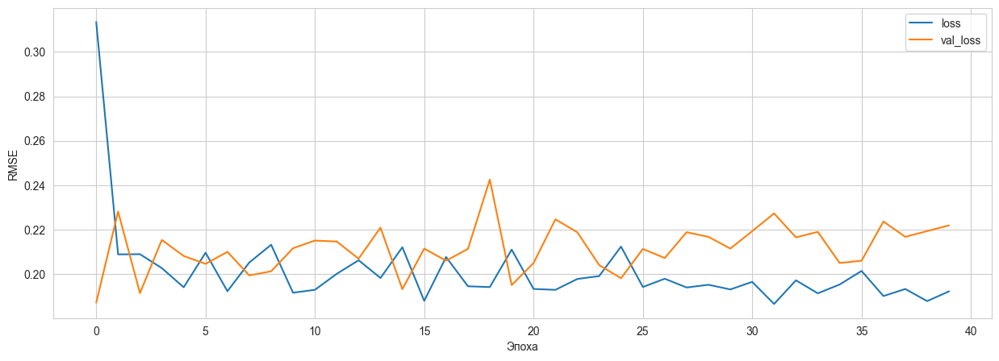

In [163]:
plot_loss(history.history)

In [164]:
# Проверяем точность нейросети на тестовых данных
model.evaluate(X_test, y_test)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1504045.0000 - root_mean_squared_error: 0.2283


[1432195.25, 0.23443034291267395]

In [165]:
# Предсказание 
y_pred = model.predict(X_test)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


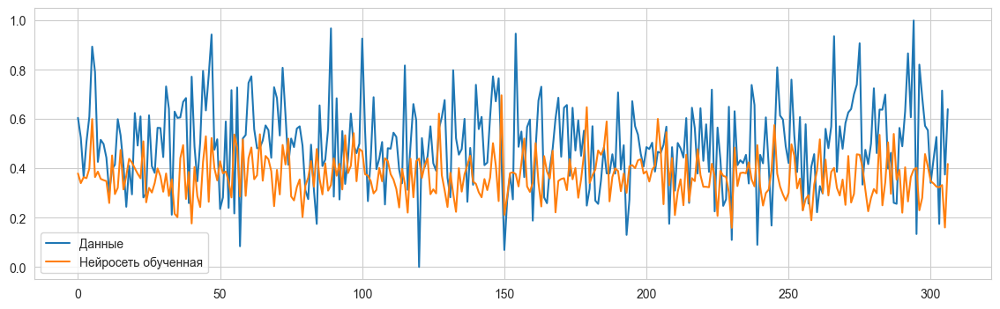

In [166]:
# Визуализация
fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(y_test, label='Данные')
ax.plot(y_pred, label='Нейросеть обученная')
ax.legend()
plt.show()

In [169]:
#@title Сохраняем модель
pickle.dump(model, open('model2.pkl', 'wb'))

!ls

"ls" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.
